# Figure 3d–g & Extended Data — cell-fraction trajectories from fitness / occurrence-time inferences

For each individual this plots the **measured variant cell fractions** at each sampling timepoint
against the **maximum-likelihood predicted trajectories** from each clone's inferred fitness `s`
and occurrence time `τ` — the **main Figure 3 d–g** panels (four pre-AML cases, wider layout) and
the **Extended Data** trajectory supplement (all cases and controls). Rare germline predisposition
variants and any MDS/CMML/MPN or pre-AML chemotherapy events are annotated.

## Data availability

Most input files are **individual-level participant data** and are **not distributed with this
code**. They are available under controlled access, deposited in the European Genome-phenome Archive (EGA) and released to approved researchers via a Data Access Committee administered by the corresponding authors.

| file | used for | location |
|---|---|---|
| `UKCTOCS_samples_processed_information.csv` | sample ages and diagnosis ages (plot x-axis) | EGA |
| `UKCTOCS_non-germline_variants_calls_SNVs_indels_mCAs.csv` | all somatic variant calls (VAFs / mCA cell fractions) | EGA |
| `UKCTOCS_germline_variants_calls_SNV_indel_panel.csv` | all germline variant calls (SNV/ indel panel) | EGA |
| `Other_haem_diagnososes_chemo_smoking_information.csv` | clinical events annotated on the plots | EGA |
| `UKCTOCS_read_depths_at_variant_positions.csv` | total read depth at each reported variant position, used to bound the VAF at timepoints where a variant was not detected | Data_files |
| `Optimiser_results_v15.txt` | inferred fitness `s`, occurrence time `tau` and `establishment age` per clone  | Data_files |

The somatic variant calls are published in **Supplementary Tables 6 and 7**; the inferred fitness and occurrence-time estimates
in **Supplementary Table 9**; the clinical events in **Supplementary Table 10**.

The read-depth table lists only the total depth at positions that are already reported in Supplementary Table 6, so carries no additional individual-level information. It replaces the
per-sample all-positions VCFs (~17 GB) that earlier versions of this notebook read for the same purpose.

In [213]:
# import packages
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import csv
from matplotlib.ticker import MultipleLocator
import ast
import matplotlib.patches as patches
import re
import warnings

pd.options.mode.chained_assignment = None  # suppresses SettingWithCopyWarning
warnings.filterwarnings('ignore')           # suppresses UserWarning from tight_layout etc.
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'Helvetica'

In [214]:
#define the colors from colorbrewer2
grey1 = '#f7f7f7'
grey2 = '#cccccc'
grey3 = '#969696'
grey4 = '#636363'
grey5 = '#252525'

In [215]:
mutation_classes = {'NPM1': 'NPM1',
                   'DNMT3A': 'DNA methylation',
                   'TET2': 'DNA methylation',
                   'IDH1': 'DNA methylation',
                   'IDH2': 'DNA methylation',
                   'ASXL1': 'Chromatin modifiers',
                   'EZH2': 'Chromatin modifiers',
                   'RUNX1': 'Transcription factors',
                   'CEBPA': 'Transcription factors',
                   'GATA2': 'Transcription factors',
                   'BCOR': 'Transcriptional corepressors',
                   'BCORL1': 'Transcriptional corepressors',
                   'TP53': 'Tumour suppressor',
                   'PPM1D': 'Tumour suppressor',
                   'CHEK2': 'Tumour suppressor',
                   'WT1': 'Tumour suppressor',
                   'CBL': 'Tumour suppressor',
                   'DDX41': 'Tumour suppressor',
                   'SRSF2': 'Spliceosome',
                   'SF3B1': 'Spliceosome',
                   'U2AF1': 'Spliceosome',
                   'ZRSR2': 'Spliceosome',
                   'RAD21': 'Cohesin',
                   'STAG2': 'Cohesin',
                   'FLT3': 'Cell signalling',
                   'KIT': 'Cell signalling',
                   'JAK2': 'Cell signalling',
                   'KRAS': 'Cell signalling',
                   'NRAS': 'Cell signalling',
                   'PTPN11': 'Cell signalling',
                   'CSF3R': 'Cell signalling',
                   'GNB1': 'Cell signalling',
                   'GNAS': 'Cell signalling',
                   'MPL': 'Cell signalling',
                    'mCA': 'mCA',
                   '15q CNLOH': 'mCA',
                   '4q CNLOH': 'mCA',
                   'X GAIN': 'mCA',
                   '19p CNLOH': 'mCA',
                   '19q CNLOH': 'mCA',
                   '9p CNLOH': 'mCA',
                   '7q LOSS': 'mCA',
                    'chrX': 'mCA',
                    'chr19p': 'mCA',
                    'chr19q': 'mCA',
                    'chr9p': 'mCA',
                    'chr7q': 'mCA',
                    'chr4q': 'mCA',
                    'chr15q': 'mCA',
                   'X': 'missing driver',
                   'Z': 'missing driver 2'}

# Create dictionary of sample details

In [216]:
#create a dictionary of the sample details
cases = {} #e.g. {'C92_002': ['C92_002_s1', 'C92_002_s2', 'C92_002_s3', 'C92_002_s4'....]}
controls = {} #e.g. {'CNTRL_001': ['CNTRL_001_s1', 'CNTRL_001_s10', 'CNTRL_001_s2'...]}
cases_and_controls = {}
sample_ages = {} #e.g. {'C92_002_s1': 73..., 'C92_002_s2': 75..., 'C92_002_s3': 75......}
sample_ages_dict = {} #e.g. C92_002 = [73..., 75..., 75.....]
sample_ages_dict_names = {} #e.g. {C92_002: {73..: C92_002_s1, 75..: C92_002_s2...}}
sample_diagnosis_age = {} #e.g. {'C92_002': 81.., 'C92_003': 75.., 'C92_005': 70...}
sample_DNA_amount = {} #e.g. {'C92_002_s1': '45', 'C92_002_s2': '50', 'C92_002_s3': '50'...}
matched_sample = {} #e.g. {'C92_002': 'CNTRL_169', 'C92_003': 'CNTRL_002'...}

with open('Data_files/UKCTOCS_samples_processed_information.csv') as csvfile:
    readreader = csv.reader(csvfile)
    row_count=0
    for row in readreader:
        if row_count>0:
            sample_name = row[1].split('_')[0]+'_'+row[1].split('_')[1]
            timepoint = row[1]
            sample_ages[timepoint]=float(row[8]) #dictionary of e.g. C92_007_s2 = 76
            
            if sample_name in sample_ages_dict.keys():
                sample_ages_dict[sample_name].append(float(row[8]))
            else:
                sample_ages_dict[sample_name]=[float(row[8])]
                
            if sample_name in sample_ages_dict_names.keys():
                sample_ages_dict_names[sample_name][float(row[8])]=timepoint
            else:
                sample_ages_dict_names[sample_name]={float(row[8]): timepoint}
                
            sample_DNA_amount[timepoint]=row[4]
            if row[9]!='':
                if '_' in row[9]:
                    matched_sample_name = row[9].split('_')[0]+'_'+row[9].split('_')[1]
                    matched_sample[sample_name]=matched_sample_name
                    
            if sample_name in cases_and_controls.keys():
                cases_and_controls[sample_name].append(timepoint)
            else:
                cases_and_controls[sample_name]=[timepoint]
                    
            if row[0]=='Case':
                if sample_name in cases.keys():
                    cases[sample_name].append(timepoint)
                else:
                    cases[sample_name]=[timepoint]
                    
                sample_diagnosis_age[sample_name]=float(row[7])
                
            if row[0]=='Control':
                if sample_name in controls.keys():
                    controls[sample_name].append(timepoint)
                else:
                    controls[sample_name]=[timepoint]
                if sample_name in matched_sample.keys():
                    sample_diagnosis_age[sample_name]=sample_diagnosis_age[matched_sample[sample_name]]

        row_count+=1

sample_ages_lists = {}
for k, v in sample_ages_dict.items():
    sample_ages_lists[k] = sorted(v)
        
cases_and_controls_sorted = {}
for k, v in cases_and_controls.items():
    ages_sorted = []
    for i in v:
        timepoint_number = int(i.split('_')[2][1:])
        ages_sorted.append((timepoint_number, i))
    sorted_v = sorted(ages_sorted, reverse = False)
    cases_and_controls_sorted[k]=[]
    for i in sorted_v:
        cases_and_controls_sorted[k].append(i[1])
        
# cases_and_controls_sorted

# Import the variant calls/ trajectories

In [217]:
#dataframe of variant trajectories
df = pd.read_csv("Data_files/UKCTOCS_non-germline_variants_calls_SNVs_indels_mCAs.csv")

In [218]:
def sample_trajectories(person_ID, df): #extract trajectories of each variant for a given sample, e.g. 'C92_002'

    filtered_df = df[df['sample name'].str.startswith(person_ID)]

#     person_variant_dict={}
    var_dict={}
    variant_details = {}
#     person_variant_dict[person_ID]=var_dict

    gene_variant = ''

    for index, row in filtered_df.iterrows():
        # Access data for each column by column name
        variant_type=row['variant_type']
#         if row['VAF (cell fraction for mCAs)'] != 'not processed':
        if variant_type=='SNV':
            variant=row['AA_change']
            gene=row['gene']
            VAF=float(row['VAF (cell fraction for mCAs)'])
            age=row['age_sample_taken']
            gene_variant=gene+'_'+variant
        elif (variant_type=='CNLOH' or variant_type=='CN-LOH' or variant_type=='GAIN' or variant_type=='gain' or variant_type=='loss' or variant_type == 'LOSS'):
            VAF=row['VAF (cell fraction for mCAs)']
            age=row['age_sample_taken']
            chromosome=row['chromosome']
            gene_variant=chromosome+'_'+variant_type
        elif (variant_type=='Deletion' or variant_type=='Insertion' or variant_type=='Complex'):
            VAF=float(row['VAF (cell fraction for mCAs)'])
            variant=row['AA_change']
            age=row['age_sample_taken']
            gene=row['gene']
            gene_variant=gene+'_'+variant
        elif (variant_type=='ITD'):
            VAF=float(row['VAF (cell fraction for mCAs)'])
            variant=row['AA_change']
            age=row['age_sample_taken']
            gene=row['gene']
            gene_variant=gene+'_'+variant
            
        if gene_variant in var_dict.keys():
            if VAF != 'not processed':
                var_dict[gene_variant][age]=float(VAF)
        else:
            if VAF != 'not processed':
                var_dict[gene_variant]={age: float(VAF)}
            
        if gene_variant != '':
            if variant_type not in ('CNLOH', 'CN-LOH', 'GAIN', 'LOSS', 'gain', 'gain?', 'loss'):
                chromosome = row['chromosome']
                start = int(row['start'])
                ref = row['REF']
                variant_details[gene_variant]=(chromosome, start, ref)
            else:
                variant_details[gene_variant]=(chromosome, '', '')

    return var_dict, variant_details

In [219]:
def dictionary_sample_details(sample_ID):

    sample_ages = {} #e.g. {'C92_002_s1': 73.., 'C92_002_s2': 75..., 'C92_002_s3': 75......}
    sample_ages_dict = {} #e.g. C92_002 = [73.73, 75.0, 75.83...]
    sample_ages_dict_names = {} #e.g. {C92_002: {73...: C92_002_s1, 75...: C92_002_s2...}}
    sample_diagnosis_age = {} #e.g. {'C92_002': 81..., 'C92_003': 75.., 'C92_005': 70......}
    # sample_DNA_amount = {} #e.g. {'C92_002_s1': '45', 'C92_002_s2': '50', 'C92_002_s3': '50'...}
    matched_sample = {} #e.g. {'C92_002': 'CNTRL_169', 'C92_003': 'CNTRL_002'...}

    with open('Data_files/UKCTOCS_samples_processed_information.csv') as csvfile:
        readreader = csv.reader(csvfile)
        row_count=0
        for row in readreader:
            if row_count>0:
                sample_name = row[1].split('_')[0]+'_'+row[1].split('_')[1]
                timepoint = row[1]
                sample_ages[timepoint]=float(row[8])
                sample_DNA_amount[timepoint]=row[4]

                if sample_name in sample_ages_dict.keys():
                    sample_ages_dict[sample_name].append(float(row[8]))
                else:
                    sample_ages_dict[sample_name]=[float(row[8])]

                if sample_name in sample_ages_dict_names.keys():
                    sample_ages_dict_names[sample_name][float(row[8])]=timepoint
                else:
                    sample_ages_dict_names[sample_name]={float(row[8]): timepoint}

                if row[9]!='':
                    if '_' in row[9]:
                        matched_sample_name = row[9].split('_')[0]+'_'+row[9].split('_')[1]
                        matched_sample[sample_name]=matched_sample_name

                if row[0]=='Case':
                    sample_diagnosis_age[sample_name]=float(row[7])

                if row[0]=='Control':
                    if sample_name in matched_sample.keys():
                        sample_diagnosis_age[sample_name]=sample_diagnosis_age[matched_sample[sample_name]]

            row_count+=1
    
    sample_ages_lists = {}
    for k, v in sample_ages_dict.items():
        sample_ages_lists[k] = sorted(v)

    diagnosis_age = sample_diagnosis_age[sample_ID]
    ages_dict_names = sample_ages_dict_names[sample_ID]

    return sample_ages, ages_dict_names, sample_ages_lists, diagnosis_age

# Lists of which are linear, clonal interference of late

In [220]:
linear_evolution = ['C92_002', 
                    'C92_003',
                    'C92_005',
                    'C92_007',
                    'C92_011',
                    'C92_018',
                    'C92_019',
                    'C92_024',
                    'C92_032',
                    'C92_033',
                    'C92_034',
                    'C92_041',
                    'C92_042',
                    'C92_049',
                    'C92_053',
                    'C92_054',
                    'C92_057',
                    'C92_058',
                    'C92_061',
                    'C92_062',
                    'C92_064',
                    'C92_065',
                    'C92_067',
                    'C92_068',
                    'C92_070',
                    'C92_086', 
                    'CNTRL_001', 
                    'CNTRL_002', 
                    'CNTRL_004', 
                    'CNTRL_160', 
                    'CNTRL_163', 
                    'CNTRL_164', 
                    'CNTRL_166', 
                    'CNTRL_167', 
                    'CNTRL_168', 
                    'CNTRL_169', 
                    'CNTRL_172', 
                    'CNTRL_173', 
                    'CNTRL_175', 
                    'CNTRL_179', 
                    'CNTRL_180', 
                    'CNTRL_182', 
                    'CNTRL_184', 
                    'CNTRL_185',
                    'CNTRL_186', 
                    'CNTRL_187', 
                    'CNTRL_190', 
                    'CNTRL_191', 
                    'CNTRL_193', 
                    'CNTRL_194', 
                    'CNTRL_195', 
                    'CNTRL_196', 
                    'CNTRL_197', 
                    'CNTRL_199', 
                    'CNTRL_202', 
                    'CNTRL_204']

print(len(linear_evolution))

56


In [221]:
clonal_interference = ['C92_008',
                       'C92_009',
                       'C92_012',
                       'C92_022',
                       'C92_023',
                       'C92_036',
                       'C92_045',
                       'C92_050',
                       'C92_056',
                       'C92_066',
                       'C92_090',
                      'CNTRL_005',
                      'CNTRL_162', 
                      'CNTRL_192']

print(len(clonal_interference))

14


In [222]:
late_evolution = ['C92_015',
                  'C92_043',
                  'C92_044',
                  'C92_047',
                  'C92_048',
                  'C92_052',
                  'C92_055',
                  'C92_063',
                  'C92_072',
                  'C92_016', #linear/late
                  'CNTRL_203']

print(len(late_evolution))

11


# Import germline variants

In [223]:
#dataframe of germline variants
df_germline = pd.read_csv("Data_files/UKCTOCS_germline_variants_calls_SNV_indel_panel.csv")

In [224]:
def germline_variants(person_ID, df_germline): #extract trajectories of each variant for a given sample, e.g. 'C92_002'

    filtered_df_germline = df_germline[df_germline['sample name'].str.startswith(person_ID)]

    germline_dict={}
    germline_list = []
    significant_germline = []
    significant_germline_with_hom_het = []
    all_germline = {}

    for index, row in filtered_df_germline.iterrows():
        # Access data for each column by column name
        variant_type=row['variant_type']
        variant=row['AA_change']
        gene=row['gene']
        VAF=float(row['VAF (cell fraction for mCAs)'])
        age=row['age_sample_taken']
        gene_variant=gene+'_'+variant
        exac = row['exac_all']
        clin_sig = row['clin_sig']
        clinvar_dn = row['clinvar_dn']
        cosmic_haem = row['cosmic_haem_lymphoid']
        cosmic_total = row['cosmic_total']

        if gene_variant in germline_dict.keys():
            germline_dict[gene_variant][age]=float(VAF)
        else:
            germline_dict[gene_variant]={age: float(VAF)}

        is_benign = clin_sig is not None and 'benign' in str(clin_sig).lower()
        is_rare = (exac == '.') or (float(exac) < 0.01)
        if is_rare and not is_benign and gene_variant not in significant_germline:
            significant_germline.append(gene_variant)
                        
        all_germline[gene_variant]={'exac': exac, 'clin_sig': clin_sig, 'clinvar_dn': clinvar_dn, 'cosmic haem': cosmic_haem, 'cosmic total': cosmic_total}
            
    for k, v in germline_dict.items():
        all_VAFs = []
        for age, VAF in v.items():
            all_VAFs.append(VAF)
        if np.mean(all_VAFs)>0.6:
            het_homo = '(1/1)'
        else:
            het_homo = '(0/1)'
            
        variant_summary = k.split('_')[0]+' '+k.split('_')[1]
        germline_list.append(variant_summary)
        if k in significant_germline:
            significant_germline_with_hom_het.append(variant_summary)
            
    germline_df_summary = pd.DataFrame.from_dict(all_germline, orient = 'index')
    
    germline_df_summary = germline_df_summary.sort_values(by=['exac'], ascending = False)
            
    return germline_dict, sorted(germline_list), sorted(significant_germline_with_hom_het), germline_df_summary

# Import other haem diagnoses, chemo and smoking information

In [225]:
#dataframe of germline variants
df_other_history = pd.read_csv("Data_files/Other_haem_diagnososes_chemo_smoking_information.csv")

In [226]:
other_history = {}

def parse_age_and_label(s):
    """
    Takes e.g. '61 (chemo)' or '68 (bone marrow transplant)' or '61.34'
    Returns (age, label) where label may be None
    """
    if pd.isna(s):
        return (None, None)

    s = str(s).strip()

    # extract first number
    m = re.search(r"[-+]?\d*\.?\d+", s)
    if not m:
        return (None, None)
    age = float(m.group())

    # extract optional label in brackets
    m2 = re.search(r"\(([^)]*)\)", s)
    label = m2.group(1).strip() if m2 else None

    return (age, label)

for _, row in df_other_history.iterrows():
    sample_id = row["Sample ID"]
    sample_dict = {}

    # --- Other haematological diagnoses ---
    diagnosis = row["Any other haematological diagnoses"]
    timing = row["Timing of other haem diagnoses"]
    diagnosis_age = row["Age @ AML Dx (yrs) (CASE)"]
    if sample_id == 'CNTRL_003':
        diagnosis_age = 74.67

    if pd.notna(diagnosis) and pd.notna(timing):
        diagnoses = [d.strip() for d in str(diagnosis).split(",")]
        timings_raw = [t.strip() for t in str(timing).split(",")]

        timings = []
        for t in timings_raw:
            try:
                t_val = float(t.split()[0])
                timings.append(t_val)
            except ValueError:
                continue  # Skip non-numeric entries like "Unknown"

        if len(timings) == len(diagnoses):  # Only pair if lengths match
            haem_dx = list(zip(diagnoses, timings))
            sample_dict["other_haem_Dx"] = haem_dx

    # --- Cancer (multiple; positional matching; ignore age labels) ---
    cancer = row.get("Cancer")
    cancer_age = row.get("Cancer (age)")
    if pd.notna(cancer) and pd.notna(cancer_age):
        cancers = [c.strip() for c in str(cancer).split(",")]
        cancer_ages_raw = [a.strip() for a in str(cancer_age).split(",")]

        cancer_ages = []
        for a in cancer_ages_raw:
            try:
                age_val = float(a.split()[0])  # ignore anything in brackets
                cancer_ages.append(age_val)
            except ValueError:
                continue

        if len(cancers) == len(cancer_ages):
            sample_dict["cancer"] = list(zip(cancers, cancer_ages))

    # --- Chemotherapy (type, age) ---
    chemo = row["Chemotherapy (age)"]
    if pd.notna(chemo):
        chemo_events = []
        for chunk in str(chemo).split(","):
            age_val, label = parse_age_and_label(chunk)
            if age_val is None:
                continue
            try:
                if float(age_val) < float(diagnosis_age):
                    chemo_events.append((label, age_val))
            except ValueError:
                pass

        if chemo_events:
            sample_dict["chemo"] = chemo_events

    # --- Smoking ---
    smoking = row["Smoking (pack years)"]
    if pd.notna(smoking) and smoking != "Unknown":
        try:
            sample_dict["smoking"] = float(smoking)
        except ValueError:
            pass

    if sample_dict:
        other_history[sample_id] = sample_dict

# Display result
# pprint(other_history)

# Put a bound on VAF for mutations that disappear or only appear late

In [227]:
def extract_depth(info):
    depth = int(info.split(';')[2].split('=')[1])
    return depth

In [228]:
#read depths at the variant positions, pre-extracted from the all positions vcf files
#(columns: sample_timepoint, consensus_type, chromosome, position, total_depth)
df_depths = pd.read_csv("Data_files/UKCTOCS_read_depths_at_variant_positions.csv")
depth_lookup = {(row['sample_timepoint'], row['consensus_type'], row['chromosome'], int(row['position'])): int(row['total_depth'])
                for index, row in df_depths.iterrows()}

def bounded_VAF(sample_name, sample_timepoint, chromosome, position, ref, variant): #get the total read depth at a position from the read depth table
    #e.g. sample_name = C92_002, sample_timepoint = C92_002_s7, chromosome = 'chr1', position = 1747196, ref = 'T'
    
    if variant != 'FLT3_ITD':
        consensus_type = 'DCS'
    else: #if FLT3-ITD, look at the SSCS depth...
        consensus_type = 'SSCS'
    
    #mCAs are passed an empty position (variant_details holds (chromosome, '', '')), so have no depth
    try:
        total_depth = depth_lookup[(sample_timepoint, consensus_type, chromosome, int(position))]
        highest_VAF = 1/total_depth #i.e. upper bound on what the VAF could be
    except (KeyError, ValueError, TypeError):
        highest_VAF = 0.01
    
    return highest_VAF

In [229]:
def create_bounded_variant_trajectories(sample_name, sample_variants, variant_details): #creates trajectories (with 2 timepoints) for variants with only 1 timepoint (final or first timepoint)

    bounded_sample_variants = {} #create a dictionary of just the variants for which we infer an upper bound on VAF
    all_trajectories_with_bounded = {} #include all variants

    # print('sample name = ', sample_name)
    sample_timings = sample_ages_lists[sample_name]
    # print('sample timings = ', sample_timings)

    for variant, timepoints in sample_variants.items():
        # print(variant)
        detected_times = list(timepoints.keys())
        # print('detected times = ', detected_times)
        first_detected_timepoint = detected_times[0] #the age at which the variant is first detected
        # print('first detected timepoint = ', first_detected_timepoint)
        sample_timing_first_detected = sample_timings.index(first_detected_timepoint) #where in the list of sample timings the variant was first detected (i.e. the index/ position)
        # print('sample timing first detected = ', sample_timing_first_detected)
        last_detected_timepoint = detected_times[-1] #the age at which the variant is last detected
        sample_timing_last_detected = sample_timings.index(last_detected_timepoint) #where in the list of sample timings the variant was last detected (i.e. the index/ position)

        if sample_timing_first_detected > 0: #i.e. if the age at which it is first detected is not the first age
#             print('variant not detected from beginning = ', variant)
            #preceding timpoint....
            sample_ID_first_detected = ages_dict_names[sample_timings[sample_timing_first_detected]] #e.g. C92_002_s8
            last_non_detected_age = sample_timings[sample_timing_first_detected-1] #i.e. the timepoint/age before 1st detected (i.e. last timepoint not detected)
            sample_ID_non_detected = ages_dict_names[last_non_detected_age] #e.g. C92_002_s7
            #get the chromosome, position and ref for the variant...
            chromosome = variant_details[variant][0]
            position = variant_details[variant][1]
            ref = variant_details[variant][2]
            if len(ref)>1:
                ref = ref[0]
            non_detected_bounded_VAF = float(bounded_VAF(sample_name, sample_ID_non_detected, chromosome, position, ref, variant))

            bounded_sample_variants[variant] = {last_non_detected_age: non_detected_bounded_VAF}

            if sample_timing_first_detected>=2: #i.e. 2 missing previous timepoints -> also had the bound for 2 timepoints before
                two_before_non_detected_age = sample_timings[sample_timing_first_detected-2] #i.e. two timepoints/ages before 1st detected
                sample_ID_two_non_detected = ages_dict_names[two_before_non_detected_age] #e.g. C92_002_s7
                non_detected_bounded_VAF_two_before = float(bounded_VAF(sample_name, sample_ID_two_non_detected, chromosome, position, ref, variant))

                bounded_sample_variants[variant][two_before_non_detected_age]= non_detected_bounded_VAF_two_before
                
            for k, v in timepoints.items(): #add the actual detected VAFs to the dictionary as well
                bounded_sample_variants[variant][k]=float(v)

        #if the variant is initially detected and then disappears
        if last_detected_timepoint < sample_timings[-1]: #i.e. when younger than final timepoint sample
#             print('variant initially detected then disappears = ', variant)
            sample_ID_last_detected = sample_ages_dict_names[sample_name][sample_timings[sample_timing_last_detected]] #e.g. C92_002_s7
            first_non_detected_age = sample_timings[sample_timing_last_detected+1] #i.e. the timepoint/age when first not detected (i.e. timepoint after last detected)
            sample_ID_non_detected = sample_ages_dict_names[sample_name][first_non_detected_age] #e.g. C92_002_s8
            #get the chromosome, position and ref for the variant...
            chromosome = variant_details[variant][0]
            position = variant_details[variant][1]
            ref = variant_details[variant][2]
            if len(ref)>1:
                ref = ref[0]
            non_detected_bounded_VAF = float(bounded_VAF(sample_name, sample_ID_non_detected, chromosome, position, ref, variant))
            
            if variant not in bounded_sample_variants: #i.e. not a variant that is also not detected from beginning:
                for k, v in timepoints.items(): #add the actual detected VAFs to the dictionary as well
                    if variant not in bounded_sample_variants.keys():
                        bounded_sample_variants[variant]={k: float(v)}
                    else:
                        bounded_sample_variants[variant][k]=float(v)
                bounded_sample_variants[variant][first_non_detected_age]= non_detected_bounded_VAF
            else: #i.e. missing from beginning and from end
                bounded_sample_variants[variant][first_non_detected_age]= non_detected_bounded_VAF

            if last_detected_timepoint < sample_timings[-2]: #i.e. more than 2 timepoints missing at the end:
                second_non_detected_age = sample_timings[sample_timing_last_detected+2] #i.e. the 2nd timepoint/age when first not detected (i.e. timepoint after last detected)
                sample_ID_second_non_detected = ages_dict_names[second_non_detected_age] #e.g. C92_002_s8
                second_non_detected_bounded_VAF = float(bounded_VAF(sample_name, sample_ID_second_non_detected, chromosome, position, ref, variant))

                bounded_sample_variants[variant][second_non_detected_age]= second_non_detected_bounded_VAF
    
    bounded_sample_variants_age_order = {}
    for variant, timepoints in bounded_sample_variants.items():
        sorted_timepoints_dict = {}
        sorted_timepoints = sorted(list(timepoints.keys()))
        for time in sorted_timepoints:
            sorted_timepoints_dict[time]=timepoints[time]
        bounded_sample_variants_age_order[variant]=sorted_timepoints_dict
                
    for variant, timepoints in sample_variants.items():
        if variant not in bounded_sample_variants.keys():
            all_trajectories_with_bounded[variant]=timepoints
        else:
            all_trajectories_with_bounded[variant]= bounded_sample_variants_age_order[variant]

    return bounded_sample_variants, all_trajectories_with_bounded

# Import the inferred fitness and establishment times

- Establishment time and fitness inferred using the code `Code_for_inferring_acquisition_age_and_fitness_v16.py`: results saved in `Data_files/Optimiser_results_v15.txt` (see Supplementary Fig. 46 for the provenance of that table)

In [230]:
def import_fitness_est_times(sample_name):
    df = pd.read_csv("Data_files/Optimiser_results_v15.txt", sep = '\t')
    df_sample = df[df['Sample_name']==sample_name]
    df_sample['Fitnesses'] = df_sample['Fitnesses'].apply(ast.literal_eval)
    df_sample['Tau_times'] = df_sample['Tau_times'].apply(ast.literal_eval)
    df_sample['Establishment_ages'] = df_sample['Establishment_ages'].apply(ast.literal_eval)
    df_sample['Variant_colors'] = df_sample['Variant_colors'].apply(ast.literal_eval)
    df_sample['Clone_colors'] = df_sample['Clone_colors'].apply(ast.literal_eval)
    df_sample = df_sample[['Sample_name', 'Fitnesses', 'Tau_times', 'Establishment_ages', 'Variant_colors', 'Clone_colors']]
    df_sample = df_sample.set_index('Sample_name')
    df_sample_dict = pd.DataFrame.to_dict(df_sample, orient = 'index')
    
    fitness_est_time_dict = {}
    for clone, fitness in df_sample_dict[sample_name]['Fitnesses'].items():
        tau_time = df_sample_dict[sample_name]['Tau_times'][clone]
        establishment_time = df_sample_dict[sample_name]['Establishment_ages'][clone]
        fitness_est_time_dict[clone] = {'fitness': fitness, 'est_time': tau_time, 'establishment_time': establishment_time}
    
    return fitness_est_time_dict, df_sample_dict[sample_name]['Variant_colors'], df_sample_dict[sample_name]['Clone_colors']

# Plot the clone and mutation trajectories

In [231]:
def mutation_trajectories(sample_name, clones, T, dt): #upper_freq = upper VAF (or cell fraction) to allow the likelihood to include
    #e.g. clones={('DNMT3A_p.Q606X'):{'fitness':0.67, 'est_time':60}, ('DNMT3A_p.Q606X', 'SF3B1_p.K700E'):{'fitness':0.67, 'est_time':62.}}

    for k, v in clones.items():
        s=v['fitness']
        tau=v['est_time']
        establishment_time = v['establishment_time']
        clone_size_trajectory=np.array([(1/s)*((np.exp(s*(i*dt-tau)))-1) for i in range(T)])
        clone_size_trajectory=np.where(clone_size_trajectory < 0, 0.0, clone_size_trajectory)
        v['clone_size_trajectory']=clone_size_trajectory #adds clone_size_trajectory to the clones dictionary

    total_clone_size=np.array([1.0*10**5 for i in range(T)]) #N = 10**5
    for k, v in clones.items():
        clone_size_trajectory=v['clone_size_trajectory']
        total_clone_size+=clone_size_trajectory

    for k, v in clones.items():
        clone_size_trajectory=v['clone_size_trajectory']
        clone_frequency_trajectory=clone_size_trajectory/total_clone_size
        v['clone_frequency_trajectory']=clone_frequency_trajectory #taking in to account changing N size (from other clones)

    mutation_trajectories={}
    for k, v in clones.items():   
        clone_frequency_trajectory=v['clone_frequency_trajectory']

        if 'JAK2_p.V617F' in k:
            if 'chr9p_CNLOH' in k: #i.e. if clone with both JAK2 V617F and 9p CNLOH in
                for mutation in k:
                    if mutation == 'JAK2_p.V617F':
                        if mutation in mutation_trajectories:
                            mutation_trajectories[mutation]+=clone_frequency_trajectory
                        else:
                            mutation_trajectories[mutation]=clone_frequency_trajectory
                    else:
                        if mutation in mutation_trajectories:
                            if mutation[0:3]=='chr': #i.e. if = mCA
                                mutation_trajectories[mutation]+=clone_frequency_trajectory
                            else:
                                mutation_trajectories[mutation]+=0.5*clone_frequency_trajectory
                        else: #if mutation not in mutation_trajectories
                            if mutation[0:3]=='chr': #i.e. if = mCA
                                mutation_trajectories[mutation]=clone_frequency_trajectory
                            else:
                                mutation_trajectories[mutation]=0.5*clone_frequency_trajectory

            else: #i.e. clone with JAK2 V617F, but no 9p CNLOH
                for mutation in k:
                    if mutation in mutation_trajectories:
                        if mutation[0:3]=='chr': #i.e. if = mCA
                            mutation_trajectories[mutation]+=clone_frequency_trajectory
                        else:
                            mutation_trajectories[mutation]+=0.5*clone_frequency_trajectory
                    else: #if mutation not in mutation_trajectories
                        if mutation[0:3]=='chr': #i.e. if = mCA
                            mutation_trajectories[mutation]=clone_frequency_trajectory
                        else:
                            mutation_trajectories[mutation]=0.5*clone_frequency_trajectory

        elif 'chr4q_CNLOH' in k:
            for mutation in k:
                if 'TET2' in mutation:
#                     print('chr4 CNLOH + TET2 mutation')
                    if mutation in mutation_trajectories:
                        mutation_trajectories[mutation]+=clone_frequency_trajectory
                    else:
                        mutation_trajectories[mutation]=clone_frequency_trajectory
                else:
                    if mutation in mutation_trajectories:
                        if mutation[0:3]=='chr': #i.e. if = mCA
                            mutation_trajectories[mutation]+=clone_frequency_trajectory
                        else:
                            mutation_trajectories[mutation]+=0.5*clone_frequency_trajectory
                    else: #if mutation not in mutation_trajectories
                        if mutation[0:3]=='chr': #i.e. if = mCA
                            mutation_trajectories[mutation]=clone_frequency_trajectory
                        else:
                            mutation_trajectories[mutation]=0.5*clone_frequency_trajectory

        else:
            for mutation in k:
                if mutation in mutation_trajectories:
                    if mutation[0:3]=='chr': #i.e. if = mCA
                        mutation_trajectories[mutation]+=clone_frequency_trajectory
                    else:
                        mutation_trajectories[mutation]+=0.5*clone_frequency_trajectory
                else: #if mutation not in mutation_trajectories
                    if mutation[0:3]=='chr': #i.e. if = mCA
                        mutation_trajectories[mutation]=clone_frequency_trajectory
                    else:
                        mutation_trajectories[mutation]=0.5*clone_frequency_trajectory

    return mutation_trajectories

In [232]:
def sort_trajectories_mutation_number_and_est_time(optimised_clones, new_mut_traj):
    #Sort the trajectories by acquisition age and number of mutations
    #Sort the optimised clones dictioanry by age of acquisition and number of mutations in clone
    #Sort by acquisition age
    acquisition_age = {}
    for k, v in optimised_clones.items():
        acquisition_age[k]=v['establishment_time']

    acquisition_age = {k: v for k, v in sorted(acquisition_age.items(), key=lambda item: item[1])}

    #Next sort by number of mutations in clone
    sorted_by_number_mutations = {}
    for k in sorted(acquisition_age, key=len, reverse=False):
        sorted_by_number_mutations[k] = acquisition_age[k]

    #Order the optimised clones dictionary
    sorted_optimised_clones = {}
    for k in sorted_by_number_mutations.keys():
        v = optimised_clones[k]
        sorted_optimised_clones[k]=v

    #Order the variant mutation trajectories by same order as clones dictionary
    new_mut_traj_ordered = {}

    variants_ordered = []
    for k in sorted_optimised_clones.keys():
        for i in k:
            if i not in variants_ordered:
                variants_ordered.append(i)

    for variant in variants_ordered:
        trajectory = new_mut_traj[variant]
        new_mut_traj_ordered[variant]=trajectory

    return new_mut_traj_ordered, sorted_optimised_clones, variants_ordered

In [233]:
def convert_inferred_variant_trajectories_to_cell_fractions(new_mut_traj_ordered, sorted_optimised_clones):
    #Convert the mutation trajectoris to cell fraction trajectories
    new_mut_traj_ordered_cell_fractions = {}

    for mutation, trajectory in new_mut_traj_ordered.items():
        cell_fraction_trajectory = []
        if mutation == 'JAK2_p.V617F':
            CNLOH_present = 0
            for clone in sorted_optimised_clones.keys(): #info = {'fitness': .., 'est_time': ..., 'clone_size_trajectory':..., 'clone_frequency_trajectory':...}
                if 'chr9p_CNLOH' in clone:
                    CNLOH_present+=1
            if CNLOH_present >0: #person has a clone with both JAK2 and 9p in
                timepoint=0
                for VAF in trajectory:
                    chr9p_cell_fraction = new_mut_traj_ordered['chr9p_CNLOH'][timepoint]
                    JAK2_cell_fraction = ((VAF-chr9p_cell_fraction)*2)+chr9p_cell_fraction
                    cell_fraction_trajectory.append(JAK2_cell_fraction)
                    timepoint+=1
            else: #person has JAK2 but no clone with 9p in
                for VAF in trajectory:
                    cell_fraction_trajectory.append(VAF*2) 

        elif 'TET2' in mutation:
            CNLOH_present = 0
            for clone in sorted_optimised_clones.keys(): #info = {'fitness': .., 'est_time': ..., 'clone_size_trajectory':..., 'clone_frequency_trajectory':...}
                if 'chr4q_CNLOH' in clone:
                    CNLOH_present+=1
            if CNLOH_present >0: #person has a clone with both JAK2 and 9p in
                timepoint=0
                for VAF in trajectory:
                    chr4q_cell_fraction = new_mut_traj_ordered['chr4q_CNLOH'][timepoint]
                    TET2_cell_fraction = ((VAF-chr4q_cell_fraction)*2)+chr4q_cell_fraction
                    cell_fraction_trajectory.append(TET2_cell_fraction)
                    timepoint+=1
            else: #person has TET2 but no clone with 4q in
                for VAF in trajectory:
                    cell_fraction_trajectory.append(VAF*2) 

        elif 'chr' in mutation:
            for VAF in trajectory:
                cell_fraction_trajectory.append(VAF) #already a cell fraction rather than a VAF 

        else:
            for VAF in trajectory:
                cell_fraction_trajectory.append(VAF*2)

        new_mut_traj_ordered_cell_fractions[mutation]= cell_fraction_trajectory
        
    return new_mut_traj_ordered_cell_fractions

In [234]:
def convert_sample_variants_to_cell_fractions(sample_variants, sorted_optimised_clones):
    #Convert the sample variants VAFs to cell fractions
    sample_variants_cell_fractions = {}

    for mutation, trajectory in sample_variants.items():
        cell_fraction_trajectory = {}
        if mutation == 'JAK2_p.V617F':
            CNLOH_present = 0
            for clone in sorted_optimised_clones.keys(): #info = {'fitness': .., 'est_time': ..., 'clone_size_trajectory':..., 'clone_frequency_trajectory':...}
                if 'chr9p_CNLOH' in clone:
                    CNLOH_present+=1
            if CNLOH_present >0: #person has a clone with both JAK2 and 9p in
                for age, VAF in trajectory.items():
                    if age in sample_variants['chr9p_CNLOH'].keys():
                        chr9p_cell_fraction = sample_variants['chr9p_CNLOH'][age]
                        JAK2_cell_fraction = ((VAF-chr9p_cell_fraction)*2)+chr9p_cell_fraction
                        cell_fraction_trajectory[age]=JAK2_cell_fraction
                    else:
                        cell_fraction_trajectory[age]=VAF*2
            else: #person has JAK2 but no clone with 9p in
                for age, VAF in trajectory.items():
                    cell_fraction_trajectory[age]=VAF*2

        elif 'TET2' in mutation:
            CNLOH_present = 0
            for clone in sorted_optimised_clones.keys(): #info = {'fitness': .., 'est_time': ..., 'clone_size_trajectory':..., 'clone_frequency_trajectory':...}
                if 'chr4q_CNLOH' in clone:
                    CNLOH_present+=1
            if CNLOH_present >0: #person has a clone with both JAK2 and 9p in
                for age, VAF in trajectory.items():
                    if age in sample_variants['chr4q_CNLOH'].keys():
                        chr4q_cell_fraction = sample_variants['chr4q_CNLOH'][age]
                        TET2_cell_fraction = ((VAF-chr4q_cell_fraction)*2)+chr4q_cell_fraction
                        cell_fraction_trajectory[age]=TET2_cell_fraction
                    else:
                        cell_fraction_trajectory[age]=VAF*2
            else: #person has TET2 but no clone with 4q in
                for age, VAF in trajectory.items():
                    cell_fraction_trajectory[age]=VAF*2

        elif 'chr' in mutation:
            for age, VAF in trajectory.items():
                cell_fraction_trajectory[age]=VAF #already a cell fraction rather than a VAF 

        else:
            for age, VAF in trajectory.items():
                cell_fraction_trajectory[age]=VAF*2

        sample_variants_cell_fractions[mutation]= cell_fraction_trajectory
    
    return sample_variants_cell_fractions

In [235]:
def convert_bounded_sample_variants_to_cell_fractions(sample_variants, bounded_sample_variants, sorted_optimised_clones):
    #Convert the sample variants VAFs to cell fractions
    bounded_sample_variants_cell_fractions = {}

    for mutation, trajectory in bounded_sample_variants.items():
        cell_fraction_trajectory = {}
        if mutation == 'JAK2_p.V617F':
            CNLOH_present = 0
            for clone in sorted_optimised_clones.keys(): #info = {'fitness': .., 'est_time': ..., 'clone_size_trajectory':..., 'clone_frequency_trajectory':...}
                if 'chr9p_CNLOH' in clone:
                    CNLOH_present+=1
            if CNLOH_present >0: #person has a clone with both JAK2 and 9p in
                for age, VAF in trajectory.items():
                    if age in sample_variants['chr9p_CNLOH'].keys():
                        chr9p_cell_fraction = sample_variants['chr9p_CNLOH'][age] #look in full dicitonary, not just bounded dictionary
                        JAK2_cell_fraction = ((VAF-chr9p_cell_fraction)*2)+chr9p_cell_fraction
                        cell_fraction_trajectory[age]=JAK2_cell_fraction
                    else:
                        cell_fraction_trajectory[age]=VAF*2
            else: #person has JAK2 but no clone with 9p in
                for age, VAF in trajectory.items():
                    cell_fraction_trajectory[age]=VAF*2

        elif 'TET2' in mutation:
            CNLOH_present = 0
            for clone in sorted_optimised_clones.keys(): #info = {'fitness': .., 'est_time': ..., 'clone_size_trajectory':..., 'clone_frequency_trajectory':...}
                if 'chr4q_CNLOH' in clone:
                    CNLOH_present+=1
            if CNLOH_present >0: #person has a clone with both JAK2 and 9p in
                for age, VAF in trajectory.items():
                    if age in sample_variants['chr4q_CNLOH'].keys():
                        chr4q_cell_fraction = sample_variants['chr4q_CNLOH'][age]
                        TET2_cell_fraction = ((VAF-chr4q_cell_fraction)*2)+chr4q_cell_fraction
                        cell_fraction_trajectory[age]=TET2_cell_fraction
                    else:
                        cell_fraction_trajectory[age]=VAF*2
            else: #person has TET2 but no clone with 4q in
                for age, VAF in trajectory.items():
                    cell_fraction_trajectory[age]=VAF*2

        elif 'chr' in mutation:
            for age, VAF in trajectory.items():
                cell_fraction_trajectory[age]=VAF #already a cell fraction rather than a VAF 

        else:
            for age, VAF in trajectory.items():
                cell_fraction_trajectory[age]=VAF*2

        bounded_sample_variants_cell_fractions[mutation]= cell_fraction_trajectory
    
    return bounded_sample_variants_cell_fractions

In [ ]:
def plot_trajectories_cell_fractions(sample_name, optimised_clones, T, dt, sample_variants, bounded_sample_variants, sample_ages_lists, df_germline, diagnosis_age, variant_colors_dict, clone_colors_dict):

    new_mut_traj = mutation_trajectories(sample_name, optimised_clones, T, dt) #gets the individual mutation trajectories (as apposed to clone trajectories)
    
    #Sort the optimised clones dictioanry by age of acquisition and number of mutations in clone
    new_mut_traj_ordered, sorted_optimised_clones, variants_ordered = sort_trajectories_mutation_number_and_est_time(optimised_clones, new_mut_traj)
    
    new_mut_traj_ordered_cell_fractions = convert_inferred_variant_trajectories_to_cell_fractions(new_mut_traj_ordered, sorted_optimised_clones)
    
    sample_variants_cell_fractions = convert_sample_variants_to_cell_fractions(sample_variants, sorted_optimised_clones)
    bounded_sample_variants_cell_fractions = convert_bounded_sample_variants_to_cell_fractions(sample_variants, bounded_sample_variants, sorted_optimised_clones)

    #Plotting
    plt.close('all')
    fig, axes = plt.subplots(1, 2, figsize = (27, 5.5), gridspec_kw={'width_ratios': [1, 1.9], 'wspace' : 0.35})
    plt.subplots_adjust(hspace=0.4)

    ax1 = axes[1] #log scale
    ax2 = axes[0] #log zoomed in
    
    helvetica_6 = 22.5
    helvetica_5 = 18.7
    
    ages = sample_ages_lists[sample_name] #create a list of ages at which a sample was taken

    for variant, new_traj in new_mut_traj_ordered_cell_fractions.items():
#         print('variant = ', variant)
        gene = variant.split('_')[0]
        mutation_class = mutation_classes[gene]
        if variant in variant_colors_dict.keys(): #might not be in there if missing driver
            mutation_color = variant_colors_dict[variant]
        for clone_ID, clone_coloring in clone_colors_dict.items():
            if clone_ID[-1]==variant:
#                 print('variant final in clone: ', clone_ID)
                clone_color = clone_coloring
            else:
                if variant in variant_colors_dict.keys():
                    clone_color = variant_colors_dict[variant]

        for ax in [ax1, ax2]:
            if mutation_class in ['missing driver', 'missing driver 2']:
#                 print('variant is missing driver)')
                x = []
                y = []
                x_post_diagnosis = []
                y_post_diagnosis = []
                for time, cell_frac in zip(np.linspace(0, 100, 1000), new_traj):
                    if time <= diagnosis_age: #only plot the trajectory line up to time of diagnosis
                        x.append(time)
                        y.append(cell_frac)
                    else:
                        x_post_diagnosis.append(time)
                        y_post_diagnosis.append(cell_frac)
                ax.plot(x, y,linewidth=2.5, color=clone_color, linestyle = '--', zorder = 10) #plot line
                ax.plot(x_post_diagnosis, y_post_diagnosis, linewidth=2.5, color=clone_color, linestyle = '--', zorder = 10, alpha = 0.25) #plot line
            else:
#                 print('variant is not missing driver')
                x = []
                y = []
                x_post_diagnosis = []
                y_post_diagnosis = []
                for time, cell_frac in zip(np.linspace(0, 100, 1000), new_traj):
                    if time <= diagnosis_age: #only plot the trajectory line up to time of diagnosis
                        x.append(time)
                        y.append(cell_frac)
                    else:
                        x_post_diagnosis.append(time)
                        y_post_diagnosis.append(cell_frac)
                ax.plot(x, y,linewidth=2.5, color=clone_color, zorder = 10) #plot line  
                ax.plot(x_post_diagnosis, y_post_diagnosis, linewidth=2.5, color=clone_color, zorder = 10, alpha = 0.25) #plot line  

        if variant in sample_variants_cell_fractions:
            timepoints_detected = []
            variant_traj=sample_variants_cell_fractions[variant]
            variant_label = variant.replace('_', ' ')
            for kk, vv in variant_traj.items():
                if vv != 'not processed':
                    timepoints_detected.append(kk)
                    for ax in [ax1, ax2]:
                        ax.scatter(kk, float(vv), color=mutation_color, s=120, edgecolors='k', zorder=100, label=variant_label) #plot datapoints
            if (sample_name in late_evolution) or (sample_name in plot_bounded): #plot bounded
                if variant in bounded_sample_variants_cell_fractions.keys():
                    bounded_traj = bounded_sample_variants_cell_fractions[variant]
                    for kk, vv in bounded_traj.items():
                        if kk not in timepoints_detected: #i.e. only plot the inferred VAF (bounded) datapoints (as dashed markers)
                            for ax in [ax1, ax2]:
                                ax.scatter(kk, float(vv), color='None', s=120, edgecolors=mutation_color, zorder=100, lw=1.5, linestyle='-') #plot datapoints

    for time in ages:
        for ax in axes.flatten():
            ax.plot([time, time], [0.000005, 1.0], color = grey2, lw = 2, linestyle = ':', zorder = 10)

    #plot diagnosis age
    for ax in [ax1, ax2]:
        ax.plot([diagnosis_age, diagnosis_age], [0.000005, 1.0], color = '#333333', lw = 4, linestyle = '--', zorder = 150)
#         ax.text(diagnosis_age, 1.7, 'AML\ndiagnosis', ha = 'center', fontsize = helvetica_6)

    #plot acquisition ages
    for k, v in optimised_clones.items():
        fitness = v['fitness']
        est_time = v['establishment_time']
        final_variant = k[-1]
        clone_color = clone_colors_dict[k]
#         clone_colors[k] = clone_color
        ax1.annotate('', xy=(est_time, 0.00001), ha="center", va="top", xytext=(0, -25), textcoords='offset points',
                     arrowprops=dict(arrowstyle="simple, head_length=1, head_width=1.5, tail_width=0.5",
                                     facecolor=clone_color,
                                     edgecolor = grey4))
        
#     square = patches.Rectangle((3*10**-4, ages[0]-1), diagnosis_age+0.5, 1.25, edgecolor='#cecece', facecolor='#f7f7f7', zorder = 0)
    square = patches.Rectangle((ages[0]-1, 3*10**-4), (diagnosis_age+0.5)-(ages[0]-1), (1-3*10**-4), lw = 2, edgecolor='#cecece', facecolor='#f7f7f7', zorder = 0)
    ax1.add_patch(square)
    
    square = patches.Rectangle((ages[0]-1, 3*10**-4), (diagnosis_age+0.5)-(ages[0]-1), (1-3*10**-4), lw = 2, edgecolor='#cecece', facecolor='#f7f7f7', zorder = 0)
    ax2.add_patch(square)
    
    arrow = patches.FancyArrowPatch((1.1, 0.5), (1.3, 0.5), edgecolor = '#898989', facecolor = '#cecece', transform=ax2.transAxes)
    ax2.add_patch(arrow)
    

    ###### format plot #######
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys(), fontsize = helvetica_5, loc='upper left', handletextpad=0.1, fancybox=True, framealpha=0.7)
    
    for ax in [ax1, ax2]:
        ax.set_yscale('log')
        
    #Set y-limits
    ax1.set_ylim(1*10**-5, 1.25)
    ax2.set_ylim(3*10**-4, 1.25)
        
    #Set y tick labels
    y_major_ticks = [0.00001, 0.0001, 0.001, 0.01, 0.1, 1.0]
    y_major_tick_labels = ["0.001%", "0.01%", "0.1%", "1%", "10%", "100%"]
    ax1.set_yticks(y_major_ticks)
    ax1.set_yticklabels(y_major_tick_labels)
        
    #Set y tick labels
    y_major_ticks = [0.001, 0.01, 0.1, 1.0]
    y_major_tick_labels = ["0.1%", "1%", "10%", "100%"]
    ax2.set_yticks(y_major_ticks)
    ax2.set_yticklabels(y_major_tick_labels)

    #Set x-limits
    ax1.set_xlim(0, 85)
    ax1.xaxis.set_major_locator(MultipleLocator(10))
    ax1.xaxis.set_minor_locator(MultipleLocator(1))
    ax2.set_xlim(ages[0]-1, diagnosis_age+0.5)
    ax2.xaxis.set_major_locator(MultipleLocator(1))

    for ax in [ax1, ax2]:
        ax.set_xlabel('age', fontsize = helvetica_6)
        ax.set_ylabel('fraction of cells (%)', fontsize = helvetica_6)
        ax.set_title('')
        ax.grid(axis = 'y', which = 'both', zorder = 0, linestyle = ':')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.tick_params(axis = 'both', which='major', length=6, width=1.5, color = '#969696')
        ax.tick_params(axis = 'both', which='minor', length=4, width=1.5, color = '#969696')
        ax.tick_params(axis='both', which='major', labelsize=helvetica_6)
        for axis in ['bottom','left']:
            ax.spines[axis].set_linewidth(1.5)
            ax.spines[axis].set_color('#969696')
            
    ax1.yaxis.set_minor_locator(plt.LogLocator(base=10, subs='all', numticks=100))
    
    if sample_name in linear_evolution:
        evolution_pattern = 'linear evolution'
    elif sample_name in clonal_interference:
        evolution_pattern = 'clonal interference'
    elif sample_name in late_evolution:
        evolution_pattern = 'late evolution'
    elif sample_name in linear_late_evolution:
        evolution_pattern = 'linear/ late evolution'
    else:
        evolution_pattern = ''
    
    ax2.text(1.05, 0.02, sample_name+': '+evolution_pattern, transform=ax2.transAxes, fontsize = helvetica_5, color = grey4, zorder = 10, rotation = 90, rotation_mode = 'anchor')
    
    germline_dict, germline_list, significant_germline, germline_df_summary = germline_variants(sample_name, df_germline)

    significant_germline_text = 'germline: '
    for i in significant_germline:
        i_label = i.replace('_', ' ')
        significant_germline_text+=i_label+', '
    if len(significant_germline)>=1:
        significant_germline_text = significant_germline_text[:-2]
        ax2.text(0.05, 0.07, significant_germline_text, transform=ax2.transAxes, fontsize = helvetica_5, color = 'black', zorder = 10, linespacing = 1.5, va = 'bottom', bbox=dict(facecolor='white', alpha = 0.5, edgecolor=grey4, boxstyle='round,pad=0.5'))
    if len(significant_germline)==0:
        significant_germline_text += 'none'
#     ax1.text(0, 1.08, significant_germline_text, transform=ax1.transAxes, fontsize = helvetica_5, color = 'black', zorder = 10, linespacing = 1.5, va = 'top')

    plt.tight_layout()
    
    return plt.show()

In [ ]:
def plot_trajectories_cell_fractions_with_other_info(sample_name, optimised_clones, T, dt, sample_variants, bounded_sample_variants, sample_ages_lists, df_germline, diagnosis_age, variant_colors_dict, clone_colors_dict, other_history, width=27):

    new_mut_traj = mutation_trajectories(sample_name, optimised_clones, T, dt) #gets the individual mutation trajectories (as apposed to clone trajectories)
    
    #Sort the optimised clones dictioanry by age of acquisition and number of mutations in clone
    new_mut_traj_ordered, sorted_optimised_clones, variants_ordered = sort_trajectories_mutation_number_and_est_time(optimised_clones, new_mut_traj)
    
    new_mut_traj_ordered_cell_fractions = convert_inferred_variant_trajectories_to_cell_fractions(new_mut_traj_ordered, sorted_optimised_clones)
    
    sample_variants_cell_fractions = convert_sample_variants_to_cell_fractions(sample_variants, sorted_optimised_clones)
    bounded_sample_variants_cell_fractions = convert_bounded_sample_variants_to_cell_fractions(sample_variants, bounded_sample_variants, sorted_optimised_clones)

    #Plotting
    plt.close('all')
    fig, axes = plt.subplots(1, 2, figsize = (width, 5.5), gridspec_kw={'width_ratios': [1, 1.9], 'wspace' : 0.35})
    plt.subplots_adjust(hspace=0.4)

    ax1 = axes[1] #log scale
    ax2 = axes[0] #log zoomed in
    
    helvetica_6 = 22.5
    helvetica_5 = 18.7
    
    ages = sample_ages_lists[sample_name] #create a list of ages at which a sample was taken

    for variant, new_traj in new_mut_traj_ordered_cell_fractions.items():
#         print('variant = ', variant)
        gene = variant.split('_')[0]
        mutation_class = mutation_classes[gene]
        if variant in variant_colors_dict.keys(): #might not be in there if missing driver
            mutation_color = variant_colors_dict[variant]
        for clone_ID, clone_coloring in clone_colors_dict.items():
            if clone_ID[-1]==variant:
#                 print('variant final in clone: ', clone_ID)
                clone_color = clone_coloring
            else:
                if variant in variant_colors_dict.keys():
                    clone_color = variant_colors_dict[variant]

        for ax in [ax1, ax2]:
            if mutation_class in ['missing driver', 'missing driver 2']:
#                 print('variant is missing driver)')
                x = []
                y = []
                x_post_diagnosis = []
                y_post_diagnosis = []
                for time, cell_frac in zip(np.linspace(0, 100, 1000), new_traj):
                    if time <= diagnosis_age: #only plot the trajectory line up to time of diagnosis
                        x.append(time)
                        y.append(cell_frac)
                    else:
                        x_post_diagnosis.append(time)
                        y_post_diagnosis.append(cell_frac)
                ax.plot(x, y,linewidth=2.5, color=clone_color, linestyle = '--', zorder = 10) #plot line
                ax.plot(x_post_diagnosis, y_post_diagnosis, linewidth=2.5, color=clone_color, linestyle = '--', zorder = 10, alpha = 0.25) #plot line
            else:
#                 print('variant is not missing driver')
                x = []
                y = []
                x_post_diagnosis = []
                y_post_diagnosis = []
                for time, cell_frac in zip(np.linspace(0, 100, 1000), new_traj):
                    if time <= diagnosis_age: #only plot the trajectory line up to time of diagnosis
                        x.append(time)
                        y.append(cell_frac)
                    else:
                        x_post_diagnosis.append(time)
                        y_post_diagnosis.append(cell_frac)
                ax.plot(x, y,linewidth=2.5, color=clone_color, zorder = 10) #plot line  
                ax.plot(x_post_diagnosis, y_post_diagnosis, linewidth=2.5, color=clone_color, zorder = 10, alpha = 0.25) #plot line  

        if variant in sample_variants_cell_fractions:
            timepoints_detected = []
            variant_traj=sample_variants_cell_fractions[variant]
            variant_label = variant.replace('_', ' ')
            for kk, vv in variant_traj.items():
                if vv != 'not processed':
                    timepoints_detected.append(kk)
                    for ax in [ax1, ax2]:
                        ax.scatter(kk, float(vv), color=mutation_color, s=120, edgecolors='k', zorder=100, label=variant_label) #plot datapoints
            if (sample_name in late_evolution) or (sample_name in plot_bounded): #plot bounded
                if variant in bounded_sample_variants_cell_fractions.keys():
                    bounded_traj = bounded_sample_variants_cell_fractions[variant]
                    for kk, vv in bounded_traj.items():
                        if kk not in timepoints_detected: #i.e. only plot the inferred VAF (bounded) datapoints (as dashed markers)
                            for ax in [ax1, ax2]:
                                ax.scatter(kk, float(vv), color='None', s=120, edgecolors=mutation_color, zorder=100, lw=1.5, linestyle='-') #plot datapoints

    for time in ages:
        for ax in axes.flatten():
            ax.plot([time, time], [0.000005, 1.0], color = grey2, lw = 2, linestyle = ':', zorder = 10)

    #plot diagnosis age
    for ax in [ax1, ax2]:
        ax.plot([diagnosis_age, diagnosis_age], [0.000005, 1.0], color = '#333333', lw = 4, linestyle = '--', zorder = 150)
#         ax.text(diagnosis_age, 1.7, 'AML\ndiagnosis', ha = 'center', fontsize = helvetica_6)

    #plot acquisition ages
    for k, v in optimised_clones.items():
        fitness = v['fitness']
        est_time = v['establishment_time']
        final_variant = k[-1]
        clone_color = clone_colors_dict[k]
#         clone_colors[k] = clone_color
        ax1.annotate('', xy=(est_time, 0.00001), ha="center", va="top", xytext=(0, -25), textcoords='offset points',
                     arrowprops=dict(arrowstyle="simple, head_length=1, head_width=1.5, tail_width=0.5",
                                     facecolor=clone_color,
                                     edgecolor = grey4))
        
#     square = patches.Rectangle((3*10**-4, ages[0]-1), diagnosis_age+0.5, 1.25, edgecolor='#cecece', facecolor='#f7f7f7', zorder = 0)
    square = patches.Rectangle((ages[0]-1, 3*10**-4), (diagnosis_age+0.5)-(ages[0]-1), (1-3*10**-4), lw = 2, edgecolor='#cecece', facecolor='#f7f7f7', zorder = 0)
    ax1.add_patch(square)

    if sample_name == 'C92_019':
        square = patches.Rectangle((70.8, 3*10**-4), (diagnosis_age+0.5)-(70.8), (1-3*10**-4), lw = 2, edgecolor='#cecece', facecolor='#f7f7f7', zorder = 0)
        ax2.add_patch(square)
    else:
        square = patches.Rectangle((ages[0]-1, 3*10**-4), (diagnosis_age+0.5)-(ages[0]-1), (1-3*10**-4), lw = 2, edgecolor='#cecece', facecolor='#f7f7f7', zorder = 0)
        ax2.add_patch(square)
    
    arrow = patches.FancyArrowPatch((1.1, 0.5), (1.3, 0.5), edgecolor = '#898989', facecolor = '#cecece', transform=ax2.transAxes)
    ax2.add_patch(arrow)
    
    #plot other history, chemo etc...
    if sample_name in other_history.keys():
        sample_histories = other_history[sample_name]

        if 'other_haem_Dx' in sample_histories.keys():
            other_haem_Dx = sample_histories['other_haem_Dx']
            for i in other_haem_Dx:
                # print(i)
                diagnosis = i[0].split(' ')[0]
                age = i[1]

                ax2.annotate('', xy=(age, 1.03), ha="center", va="bottom", xytext=(0, 20), textcoords='offset points',
                             arrowprops=dict(arrowstyle="simple, head_length=1, head_width=1.5, tail_width=0.5",
                                             facecolor= grey3,
                                             edgecolor = grey4), clip_on=False)

                ax2.text(age, 2, diagnosis, rotation = 90, va = 'bottom', ha = 'center', fontsize = helvetica_5, color = 'black', clip_on=False, transform=ax2.transData)

        if 'chemo' in sample_histories.keys():
            chemo_hx = sample_histories['chemo']
            for i in chemo_hx:
                chemotherapy = i[0]
                chemotherapy_age = i[1]
                ax2.annotate('', xy=(chemotherapy_age, 1.03), ha="center", va="bottom", xytext=(0, 20), textcoords='offset points',
                             arrowprops=dict(arrowstyle="simple, head_length=1, head_width=1.5, tail_width=0.5",
                                             facecolor= grey3,
                                             edgecolor = grey4), clip_on=False)

                ax2.text(chemotherapy_age, 2, chemotherapy, rotation = 90, va = 'bottom', ha = 'center', fontsize = helvetica_5, color = 'black', clip_on=False, transform=ax2.transData)

        if 'cancer' in sample_histories.keys():
            cancer_Dx = sample_histories['cancer']
            for i in cancer_Dx:
                cancer_diagnosis = i[0]
                cancer_age = i[1]

                ax2.annotate('', xy=(cancer_age, 1.03), ha="center", va="bottom", xytext=(0, 20), textcoords='offset points',
                             arrowprops=dict(arrowstyle="simple, head_length=1, head_width=1.5, tail_width=0.5",
                                             facecolor= grey3,
                                             edgecolor = grey4), clip_on=False)

                ax2.text(cancer_age, 2, cancer_diagnosis, rotation = 90, va = 'bottom', ha = 'center', fontsize = helvetica_5, color = 'black', clip_on=False, transform=ax2.transData)

        
        if 'smoking' in sample_histories.keys():
            smoking = sample_histories['smoking']
        if 'smoking' not in sample_histories.keys():
            smoking = 'unknown'

    ###### format plot #######
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys(), fontsize = helvetica_5, loc='upper left', handletextpad=0.1, fancybox=True, framealpha=0.7)
    
    for ax in [ax1, ax2]:
        ax.set_yscale('log')
        
    #Set y-limits
    ax1.set_ylim(1*10**-5, 1.25)
    ax2.set_ylim(3*10**-4, 1.25)
        
    #Set y tick labels
    y_major_ticks = [0.00001, 0.0001, 0.001, 0.01, 0.1, 1.0]
    y_major_tick_labels = ["0.001%", "0.01%", "0.1%", "1%", "10%", "100%"]
    ax1.set_yticks(y_major_ticks)
    ax1.set_yticklabels(y_major_tick_labels)
        
    #Set y tick labels
    y_major_ticks = [0.001, 0.01, 0.1, 1.0]
    y_major_tick_labels = ["0.1%", "1%", "10%", "100%"]
    ax2.set_yticks(y_major_ticks)
    ax2.set_yticklabels(y_major_tick_labels)

    #Set x-limits
    ax1.set_xlim(0, 85)
    ax1.xaxis.set_major_locator(MultipleLocator(10))
    ax1.xaxis.set_minor_locator(MultipleLocator(1))
    if sample_name == 'C92_019':
        ax2.set_xlim(70.8, diagnosis_age+0.5)
    else:
        ax2.set_xlim(ages[0]-1, diagnosis_age+0.5)
    ax2.xaxis.set_major_locator(MultipleLocator(1))

    for ax in [ax1, ax2]:
        ax.set_xlabel('age', fontsize = helvetica_6)
        ax.set_ylabel('fraction of cells (%)', fontsize = helvetica_6)
        ax.set_title('')
        ax.grid(axis = 'y', which = 'both', zorder = 0, linestyle = ':')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.tick_params(axis = 'both', which='major', length=6, width=1.5, color = '#969696')
        ax.tick_params(axis = 'both', which='minor', length=4, width=1.5, color = '#969696')
        ax.tick_params(axis='both', which='major', labelsize=helvetica_6)
        for axis in ['bottom','left']:
            ax.spines[axis].set_linewidth(1.5)
            ax.spines[axis].set_color('#969696')
            
    ax1.yaxis.set_minor_locator(plt.LogLocator(base=10, subs='all', numticks=100))
    
    if sample_name in linear_evolution:
        evolution_pattern = 'linear evolution'
    elif sample_name in clonal_interference:
        evolution_pattern = 'clonal interference'
    elif sample_name in late_evolution:
        evolution_pattern = 'late evolution'
    elif sample_name in linear_late_evolution:
        evolution_pattern = 'linear/ late evolution'
    else:
        evolution_pattern = ''
    
    ax2.text(1.05, 0.02, sample_name+': '+evolution_pattern, transform=ax2.transAxes, fontsize = helvetica_5, color = grey4, zorder = 10, rotation = 90, rotation_mode = 'anchor')
    
    germline_dict, germline_list, significant_germline, germline_df_summary = germline_variants(sample_name, df_germline)

    significant_germline_text = 'germline: '
    for i in significant_germline:
        i_label = i.replace('_', ' ')
        significant_germline_text+=i_label+', '
    if len(significant_germline)>=1:
        significant_germline_text = significant_germline_text[:-2]
        ax2.text(0.05, 0.07, significant_germline_text, transform=ax2.transAxes, fontsize = helvetica_5, color = 'black', zorder = 10, linespacing = 1.5, va = 'bottom', bbox=dict(facecolor='white', alpha = 0.5, edgecolor=grey4, boxstyle='round,pad=0.5'))
    if len(significant_germline)==0:
        significant_germline_text += 'none'
#     ax1.text(0, 1.08, significant_germline_text, transform=ax1.transAxes, fontsize = helvetica_5, color = 'black', zorder = 10, linespacing = 1.5, va = 'top')

    # plt.tight_layout(rect=[0, 0, 1, 0.95])
    return plt.show()

# Samples

In [238]:
T=1000 #total timesteps
dt=0.1 #time interval i.e. 0.1 = 10% of 1 year (1000 timesteps = 100 years)

## Cases

In [239]:
plot_bounded = ['CNTRL_002', 'CNTRL_160', 'CNTRL_162', 'CNTRL_168', 'CNTRL_173', 'CNTRL_179', 
                'CNTRL_194', 'CNTRL_196', 'CNTRL_197', 'CNTRL_199', 'CNTRL_203']

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


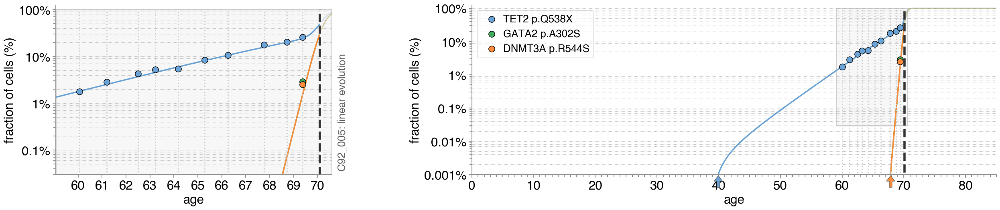

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


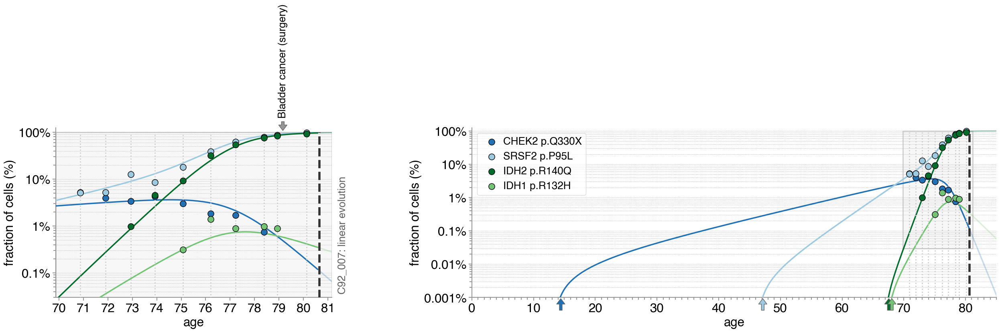

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


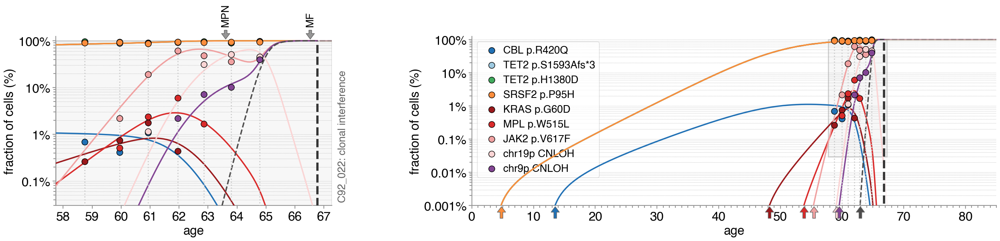

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


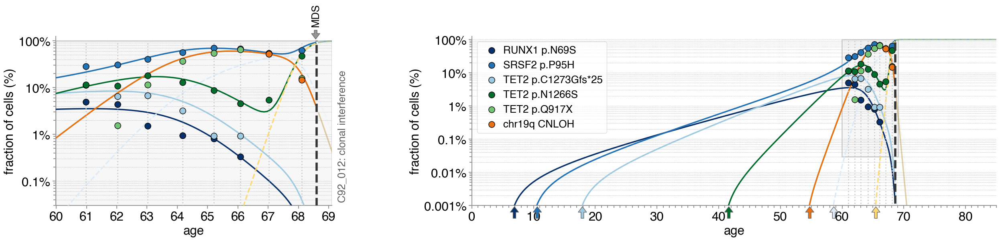

In [240]:
# Wider plots for main figure
for sample_name in ['C92_005', 'C92_007', 'C92_022', 'C92_012']:
    sample_ages, ages_dict_names, sample_ages_lists, diagnosis_age = dictionary_sample_details(sample_name)
    sample_variants, variant_details =  sample_trajectories(sample_name, df)
    bounded_sample_variants, all_trajectories_with_bounded = create_bounded_variant_trajectories(sample_name, sample_variants, variant_details)
    optimised_clones, variant_colors_dict, clone_colors_dict = import_fitness_est_times(sample_name)
    plot_trajectories_cell_fractions_with_other_info(sample_name, optimised_clones, T, dt, sample_variants, bounded_sample_variants, sample_ages_lists, df_germline, diagnosis_age, variant_colors_dict, clone_colors_dict, other_history, width=30.25)


C92_002


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


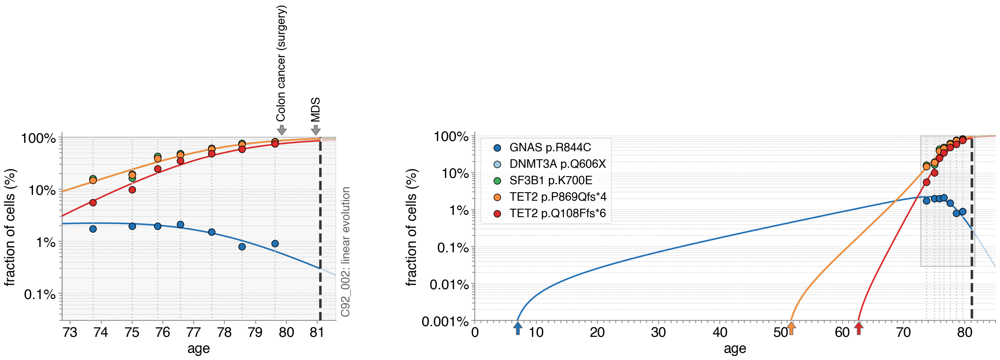


C92_003


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


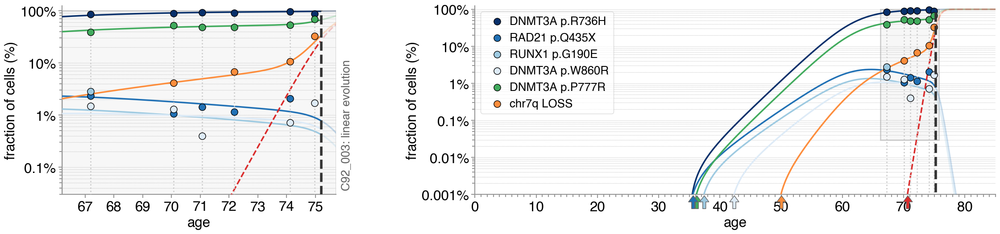


C92_005


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


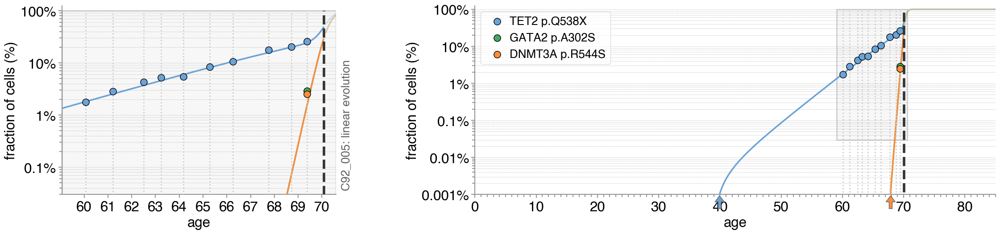


C92_007


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


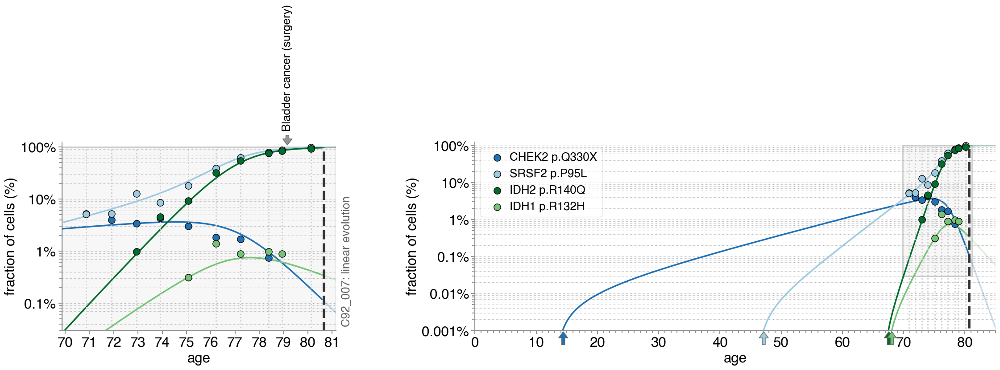


C92_008


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


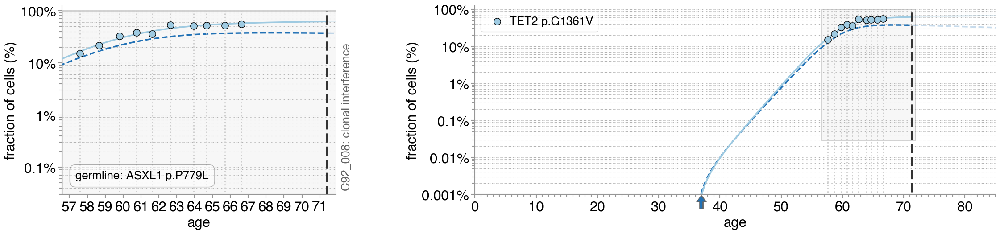

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_009


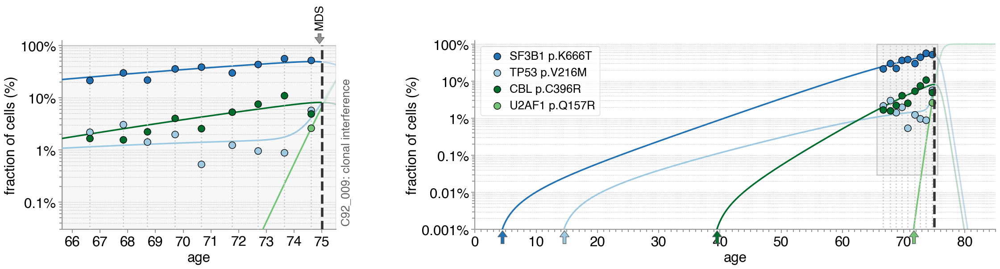


C92_011


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


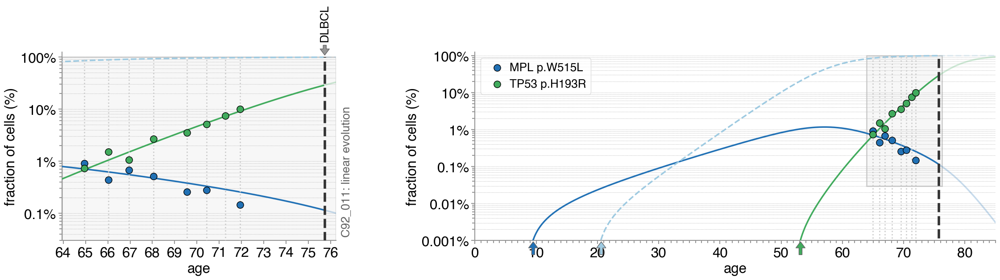


C92_012


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


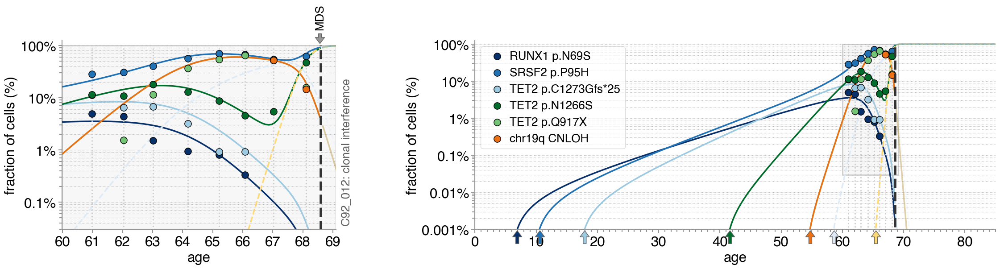


C92_015
C92_015 data not available

C92_016


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


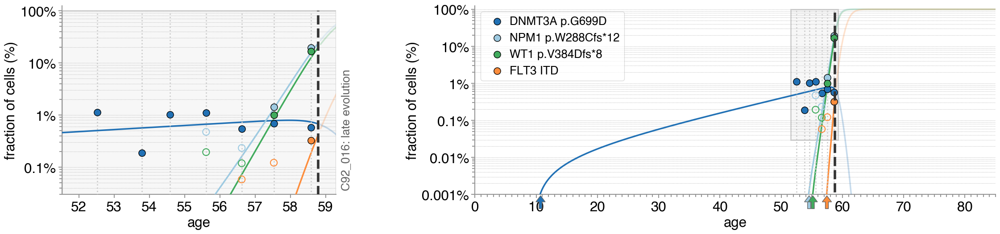


C92_018


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


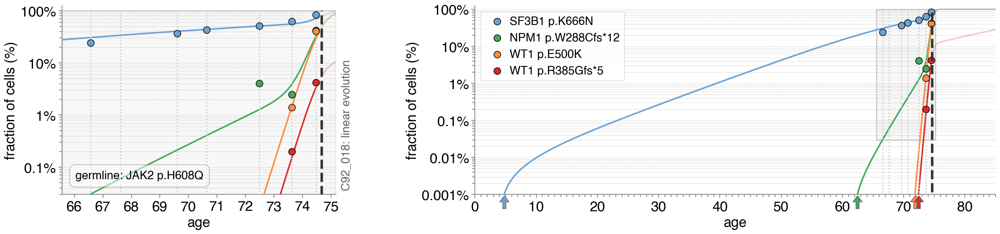


C92_019


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


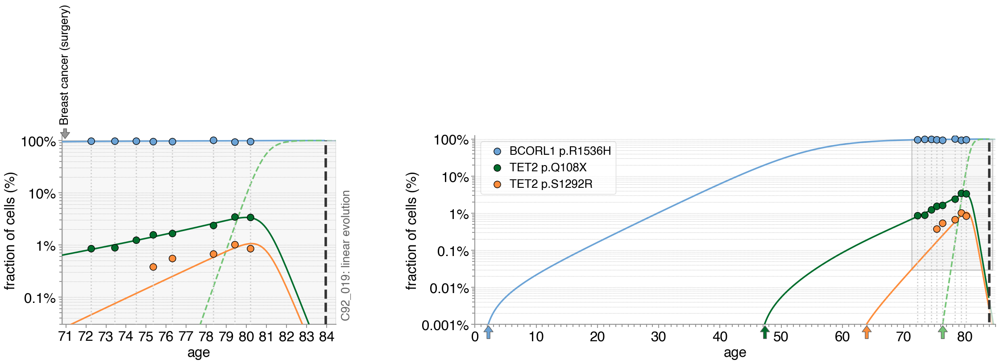


C92_022


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


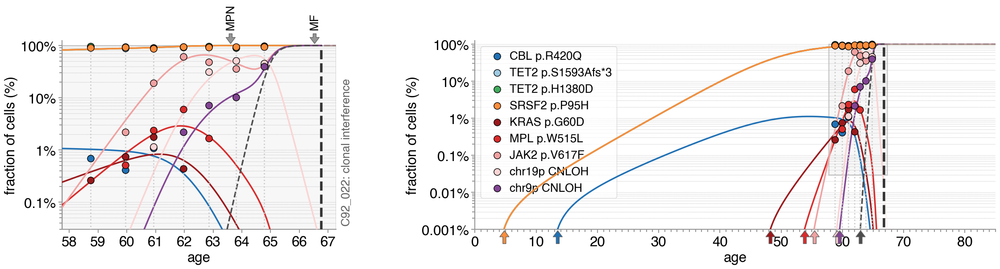


C92_023


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


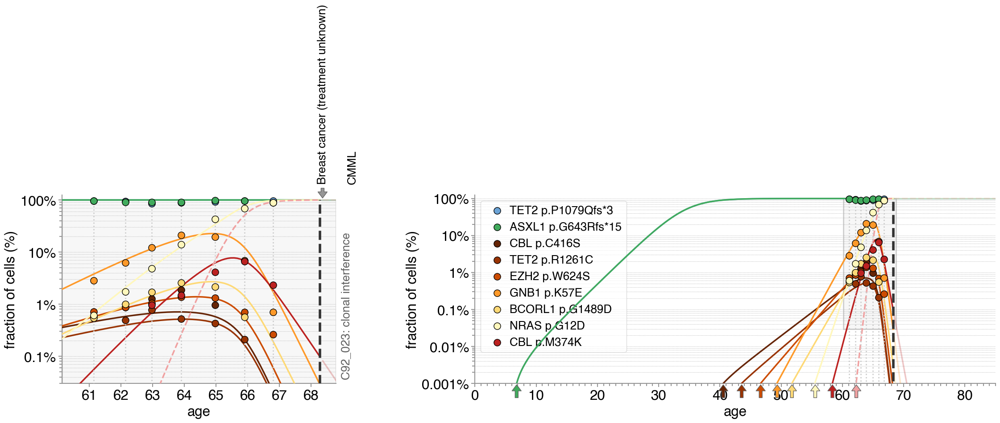


C92_024


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


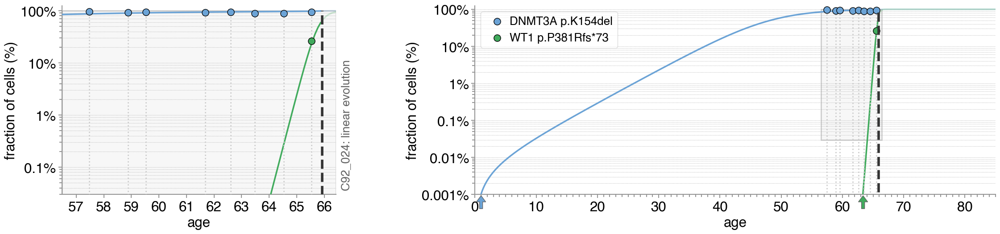


C92_032


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


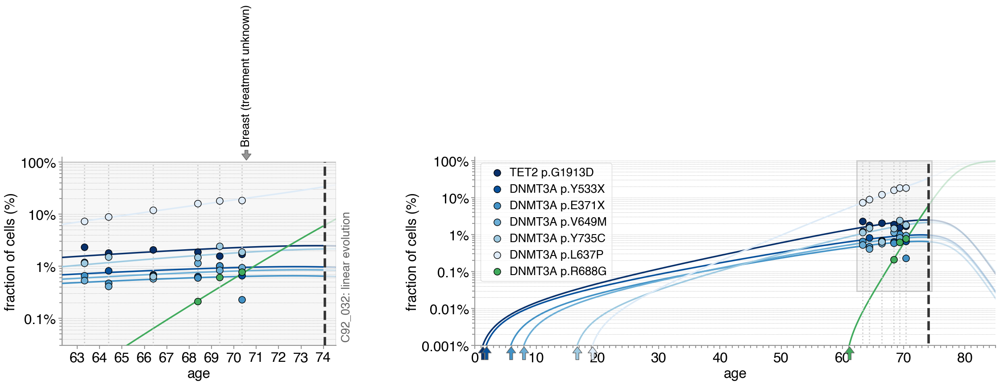

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_033


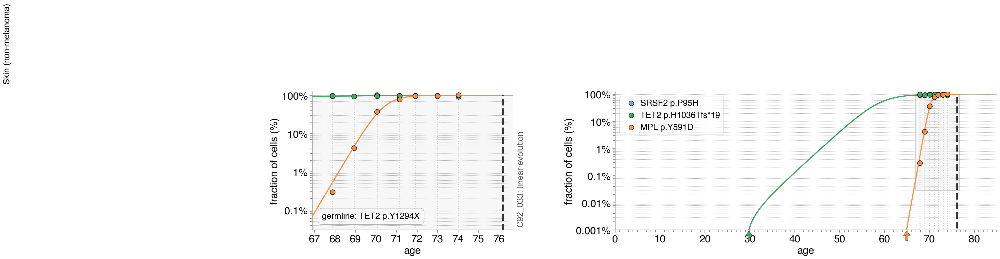


C92_034


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


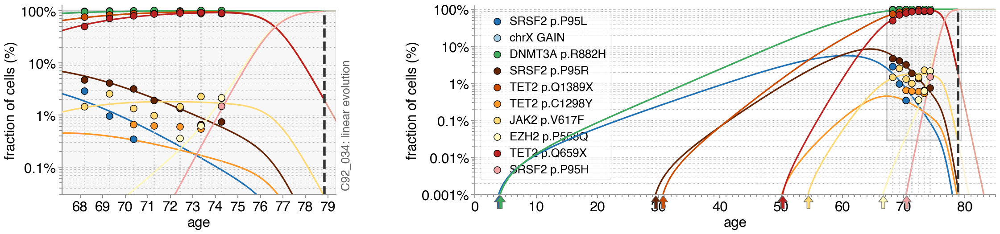

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_036


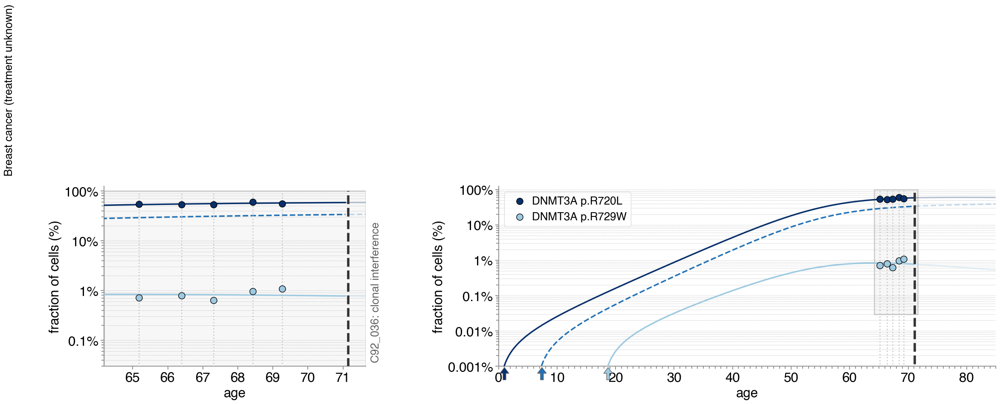

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_041


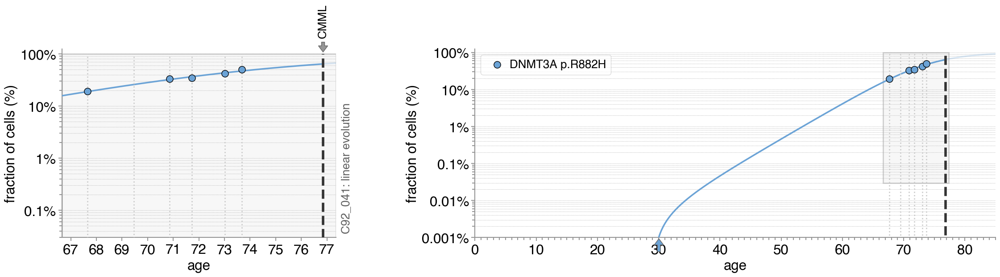


C92_042


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


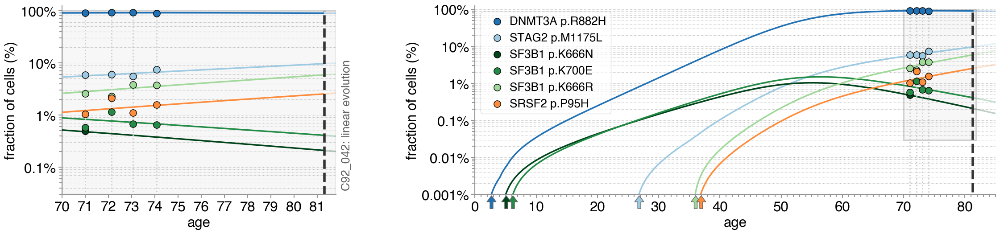


C92_043
C92_043 data not available

C92_044
C92_044 data not available

C92_045


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


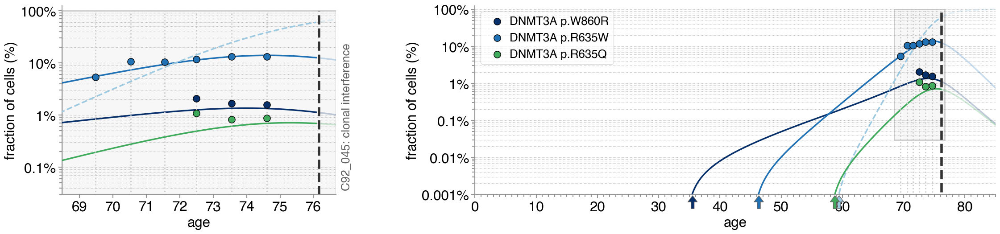

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_047


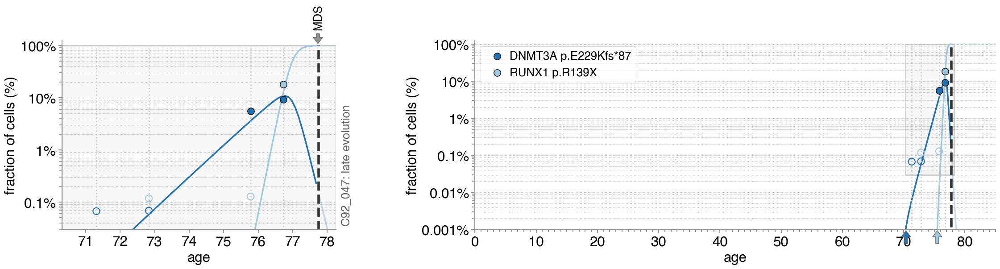

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_048
C92_048 data not available

C92_049


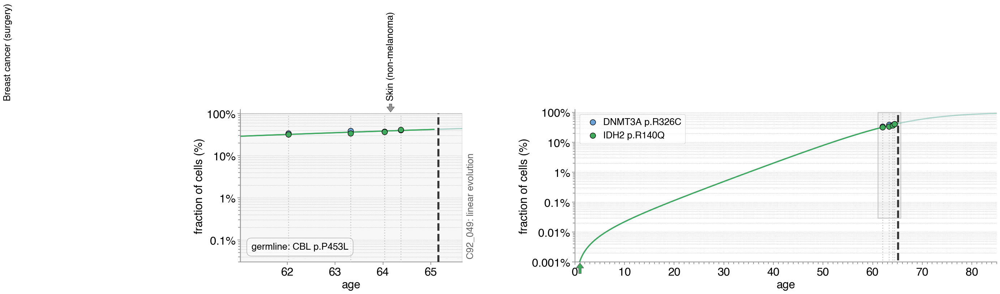

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_050


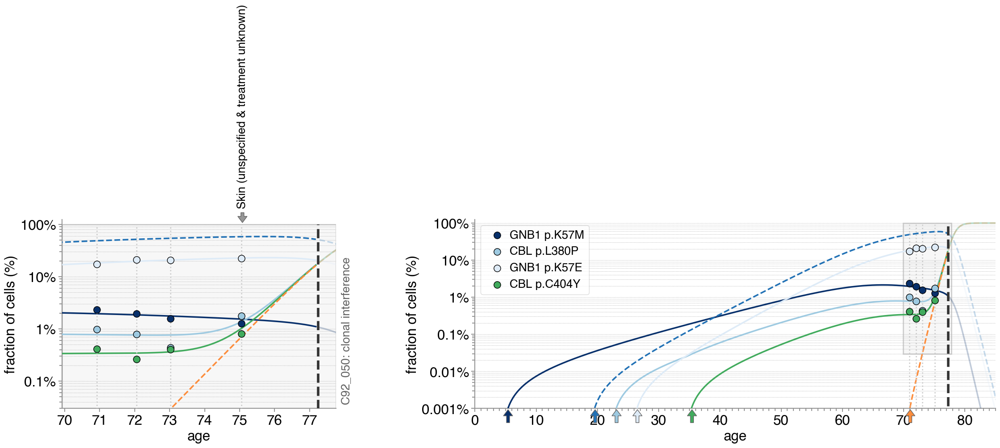

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_052


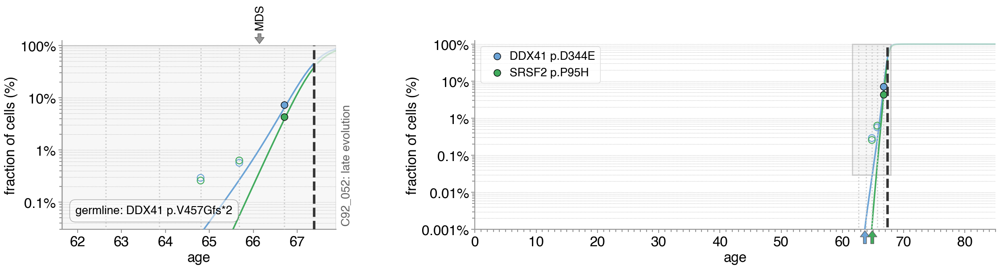


C92_053


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


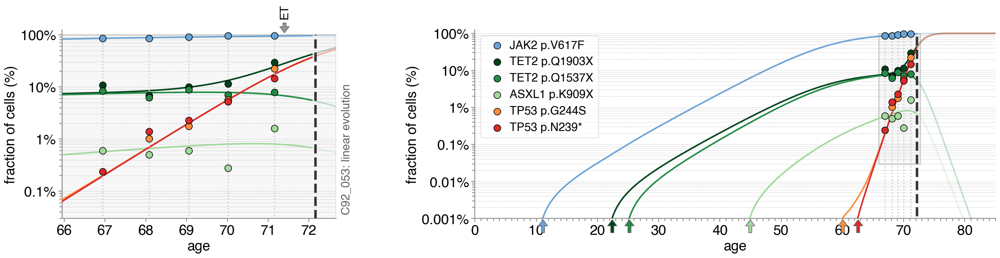

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_054


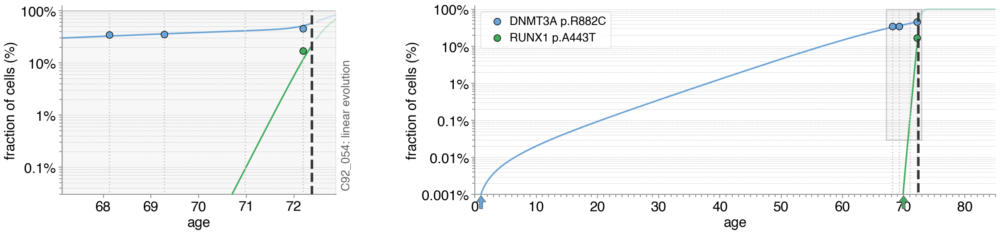

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_055


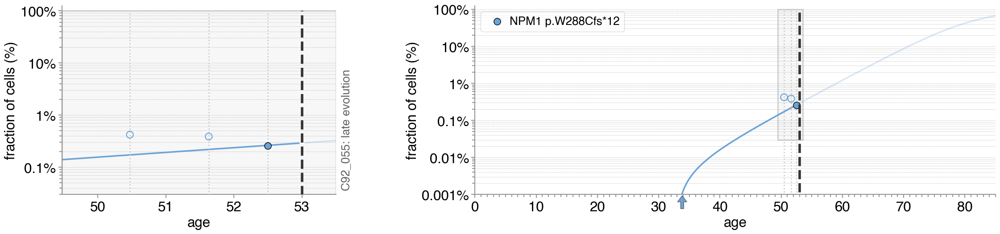


C92_056


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


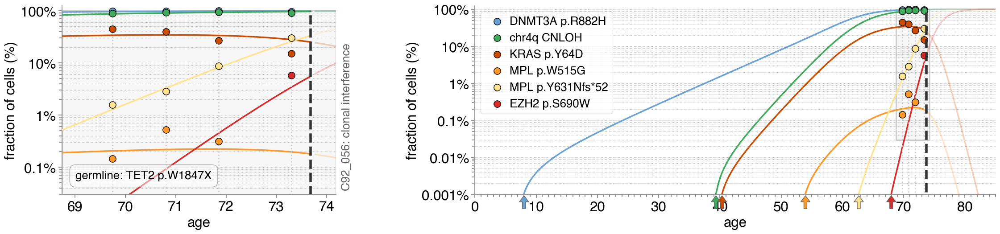


C92_057


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


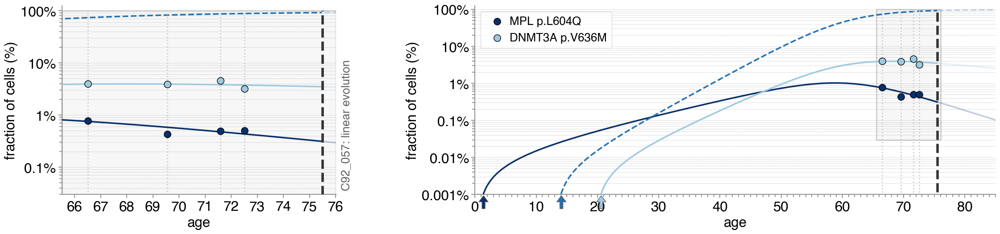

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_058


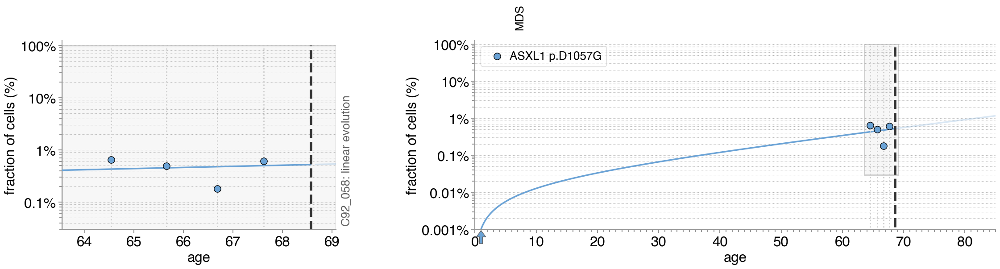


C92_061


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


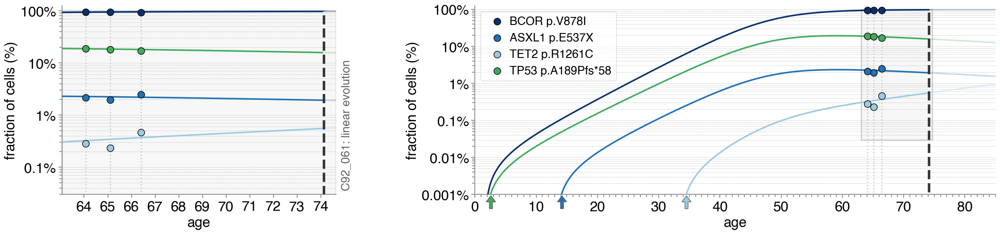

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_062


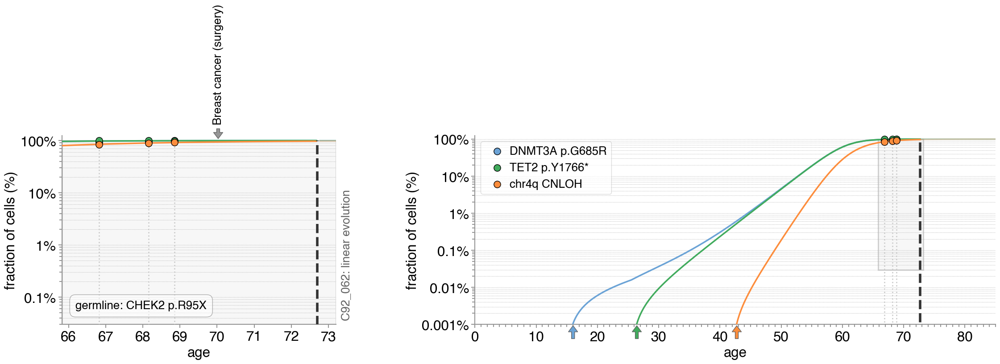


C92_063
C92_063 data not available

C92_064


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


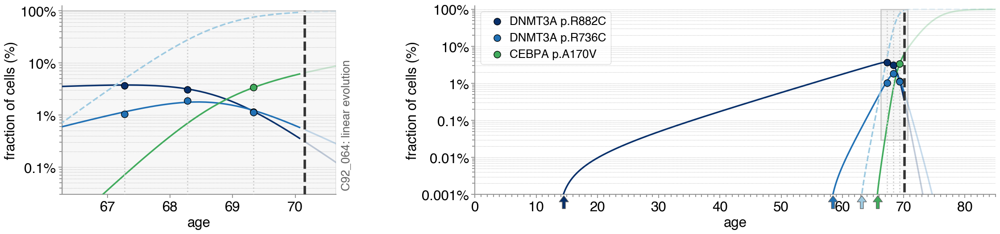

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_065


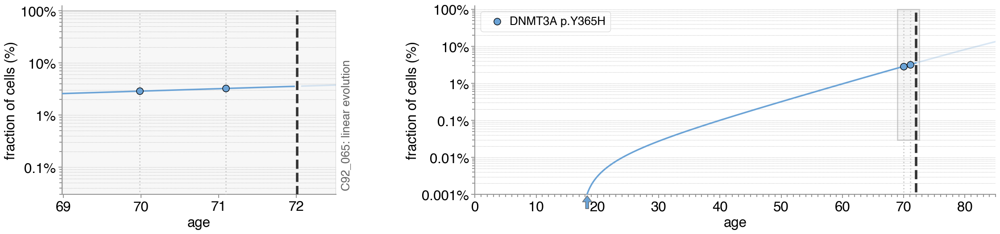


C92_066


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


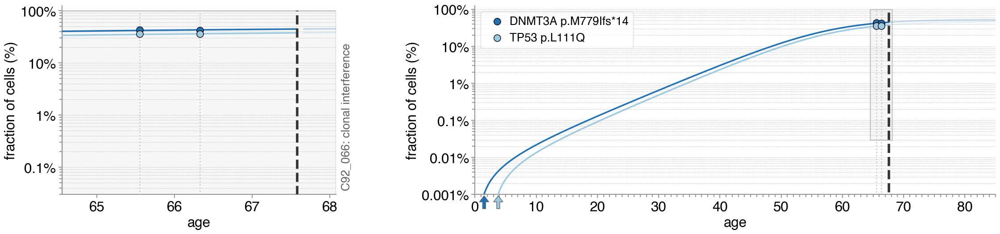

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_067


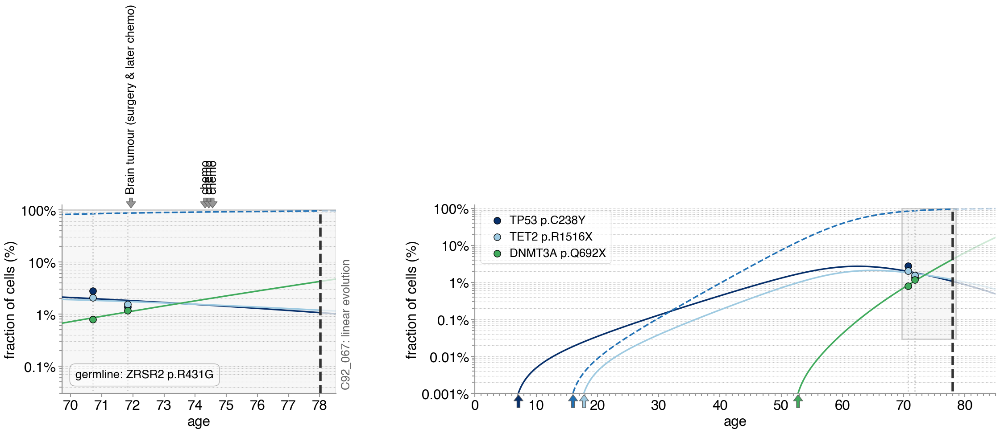

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_068


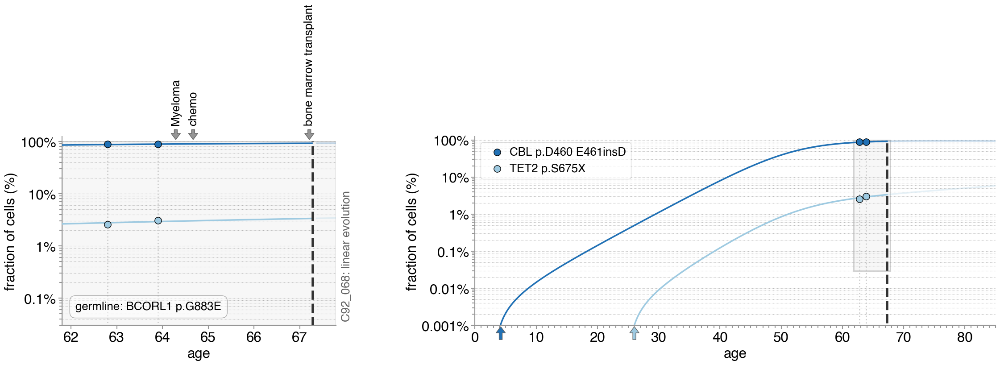

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_070


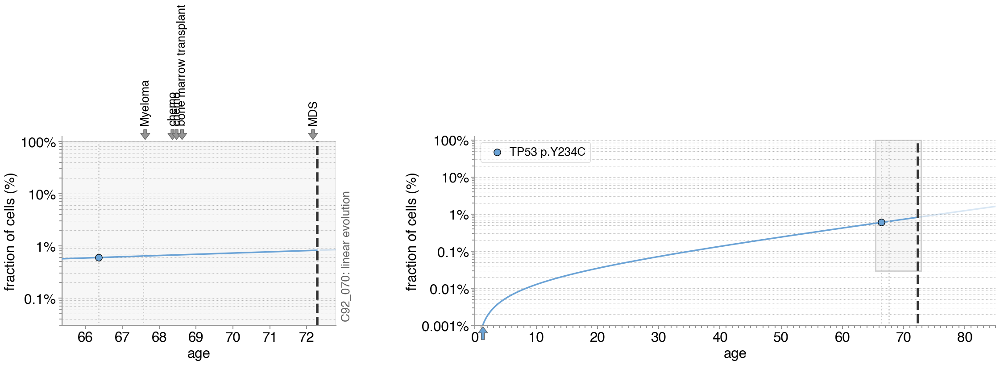

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp



C92_072


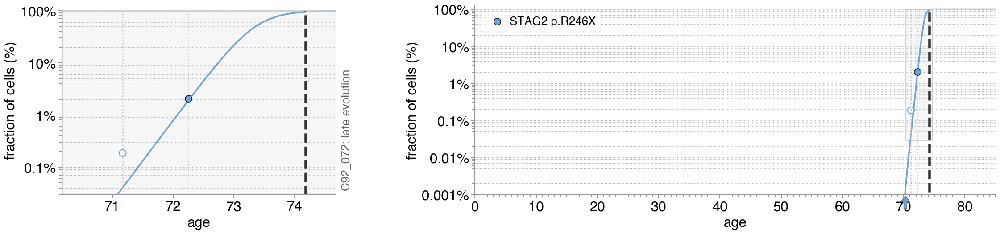


C92_086


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


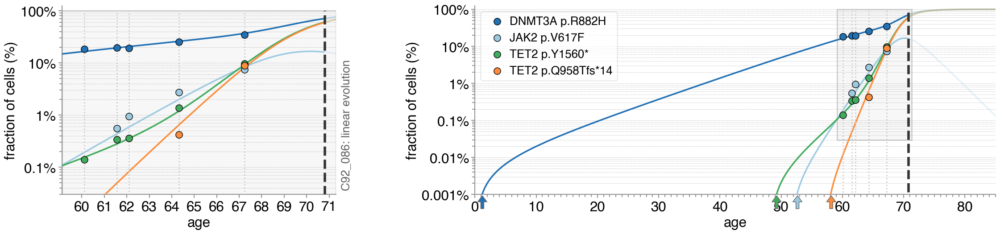


C92_090


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


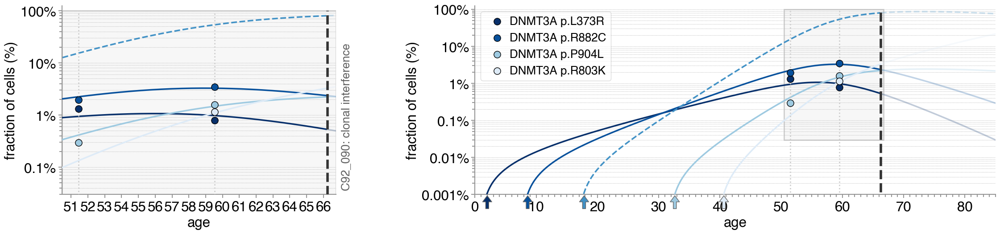

In [241]:
#standard width plots
for sample_name in cases:
    print()
    print(sample_name)
    sample_ages, ages_dict_names, sample_ages_lists, diagnosis_age = dictionary_sample_details(sample_name)
    sample_variants, variant_details =  sample_trajectories(sample_name, df)
    bounded_sample_variants, all_trajectories_with_bounded = create_bounded_variant_trajectories(sample_name, sample_variants, variant_details)
    if sample_name in other_history.keys():
        if ('other_haem_Dx' in other_history[sample_name].keys()) or ('chemo' in other_history[sample_name].keys()) or ('cancer' in other_history[sample_name].keys()): 
            try:
                optimised_clones, variant_colors_dict, clone_colors_dict = import_fitness_est_times(sample_name)
                plot_trajectories_cell_fractions_with_other_info(sample_name, optimised_clones, T, dt, sample_variants, bounded_sample_variants, sample_ages_lists, df_germline, diagnosis_age, variant_colors_dict, clone_colors_dict, other_history)
            except KeyError:
                print(sample_name+' data not available')
        else:   
            try:
                optimised_clones, variant_colors_dict, clone_colors_dict = import_fitness_est_times(sample_name)
                plot_trajectories_cell_fractions(sample_name, optimised_clones, T, dt, sample_variants, bounded_sample_variants, sample_ages_lists, df_germline, diagnosis_age, variant_colors_dict, clone_colors_dict)
            except KeyError:
                print(sample_name+' data not available')
    else:   
        try:
            optimised_clones, variant_colors_dict, clone_colors_dict = import_fitness_est_times(sample_name)
            plot_trajectories_cell_fractions(sample_name, optimised_clones, T, dt, sample_variants, bounded_sample_variants, sample_ages_lists, df_germline, diagnosis_age, variant_colors_dict, clone_colors_dict)
        except KeyError:
            print(sample_name+' data not available')

## Controls

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


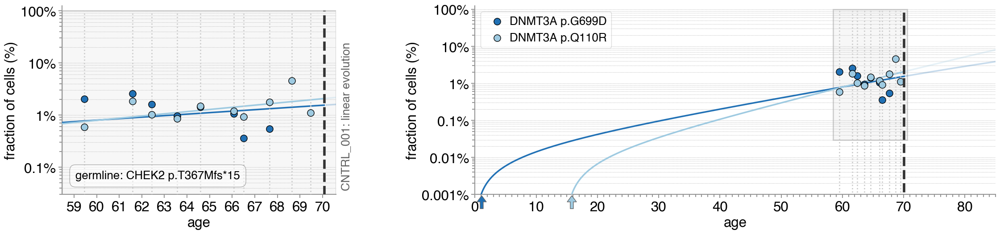

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


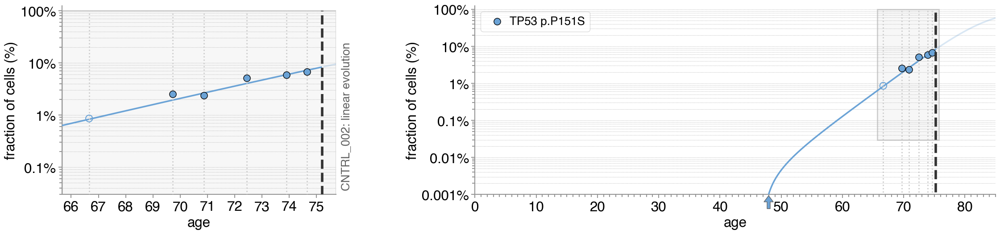

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


CNTRL_003 data not available


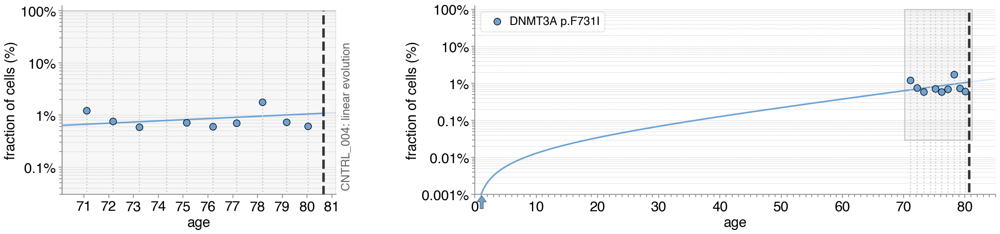

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


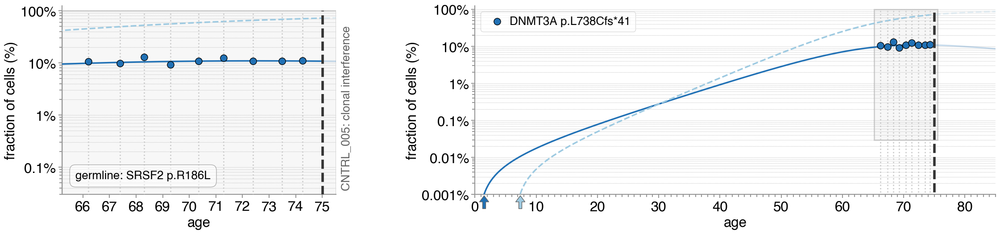

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


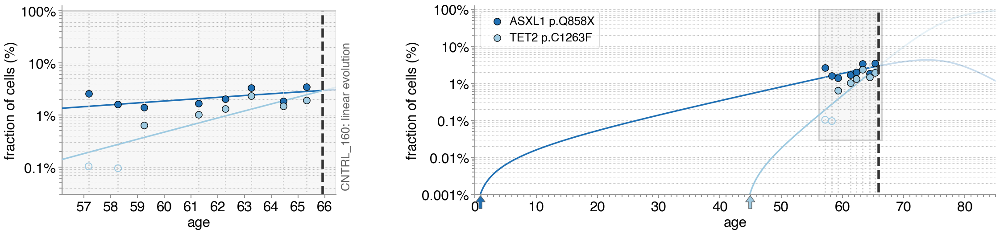

CNTRL_161 data not available


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


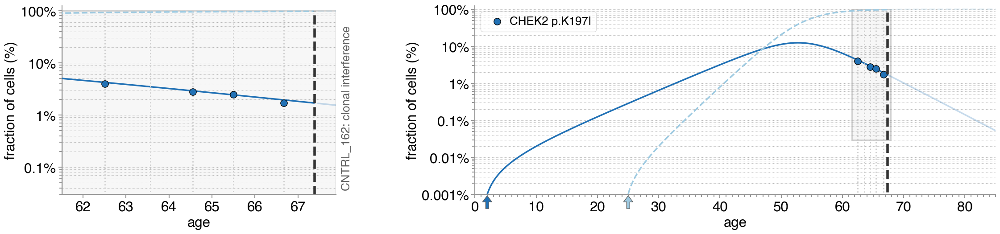

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


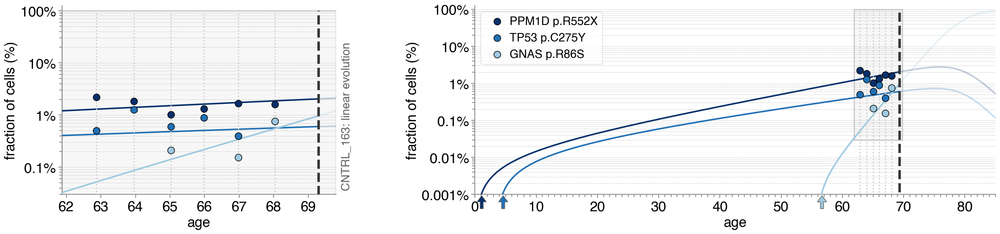

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


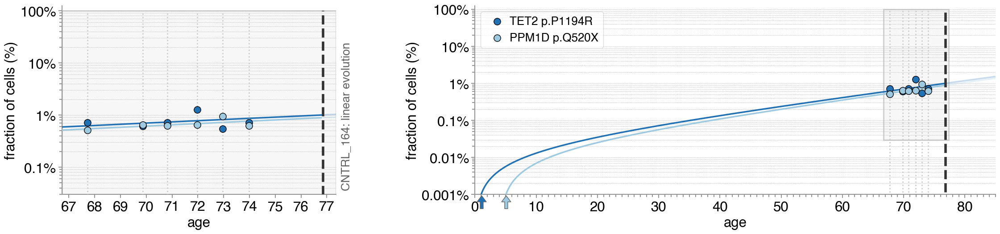

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


CNTRL_165 data not available


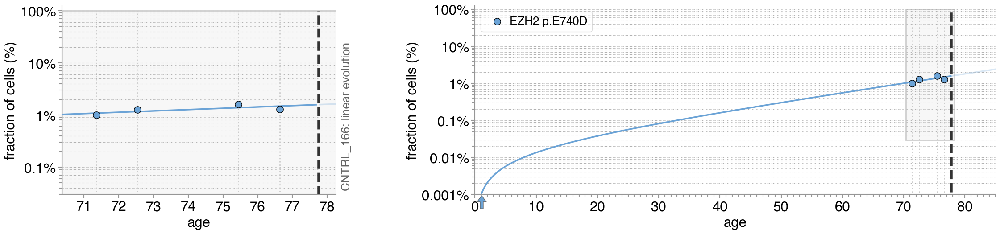

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


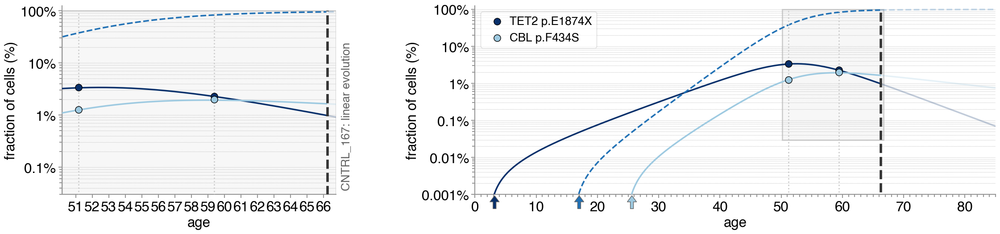

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


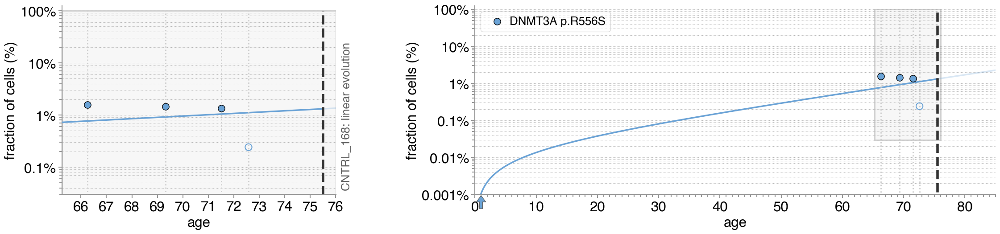

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


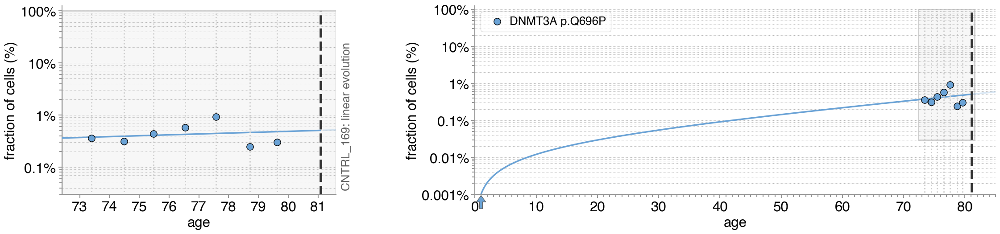

CNTRL_170 data not available
CNTRL_171 data not available


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


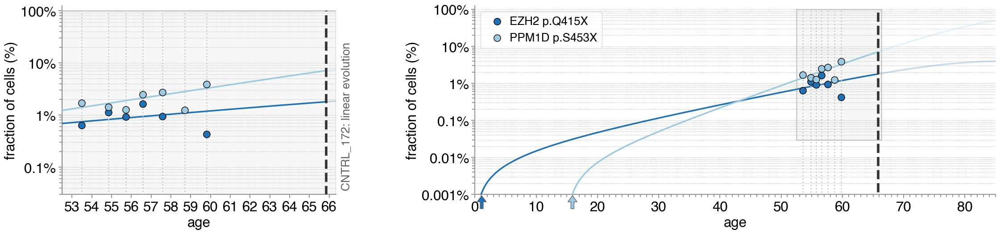

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


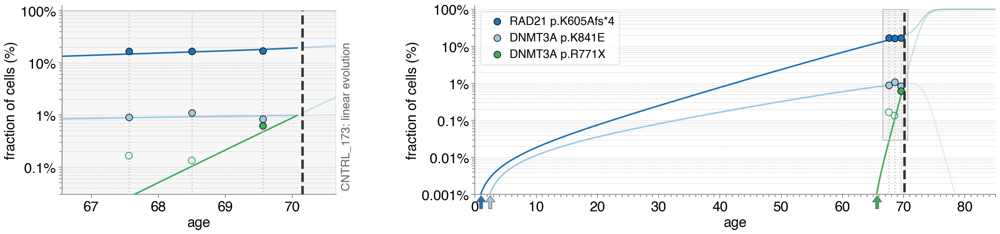

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


CNTRL_174 data not available


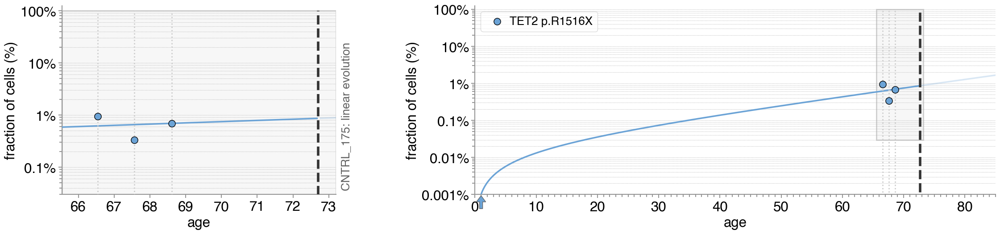

CNTRL_177 data not available


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


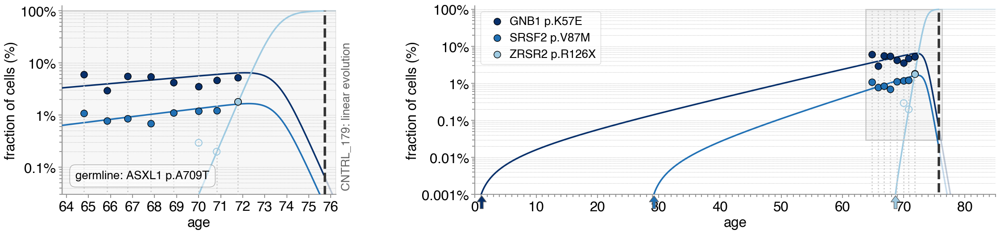

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


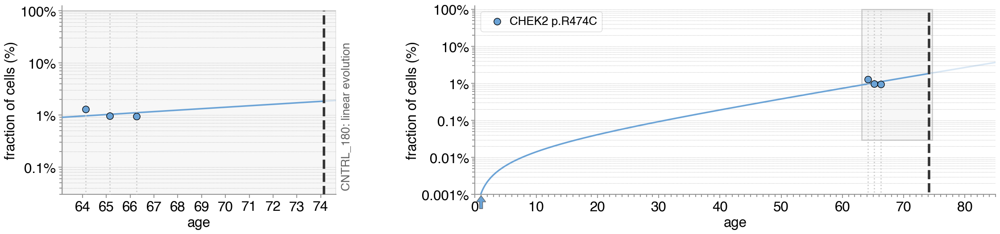

CNTRL_181 data not available


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


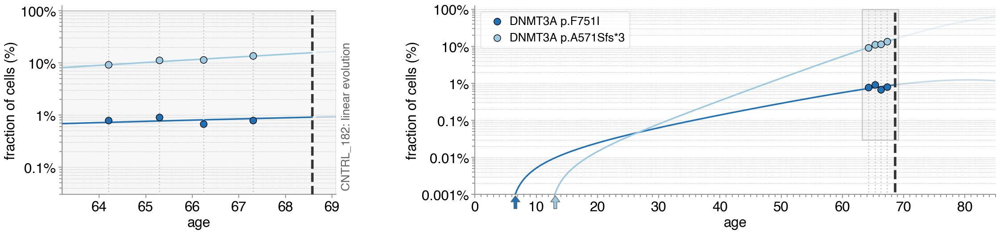

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


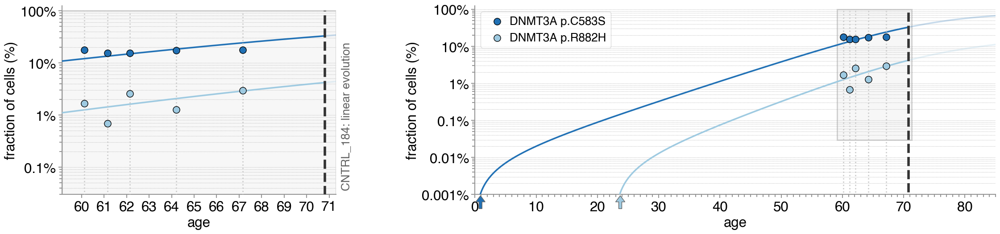

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


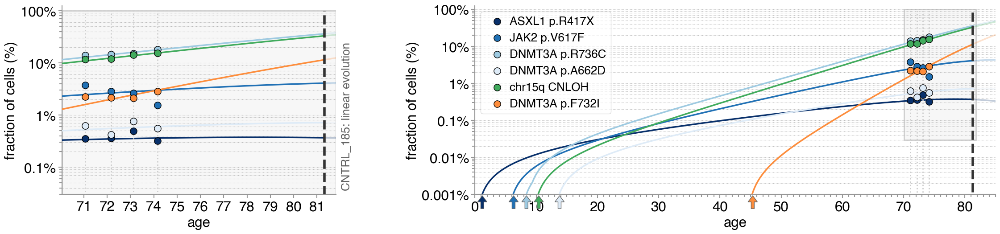

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


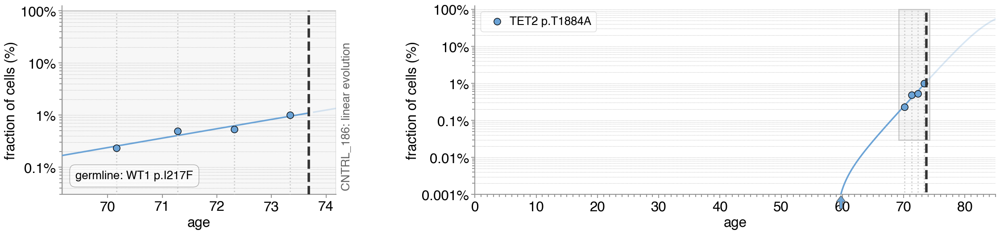

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


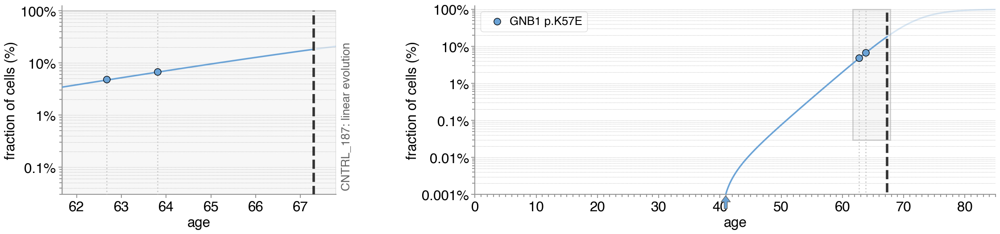

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


CNTRL_188 data not available
CNTRL_189 data not available


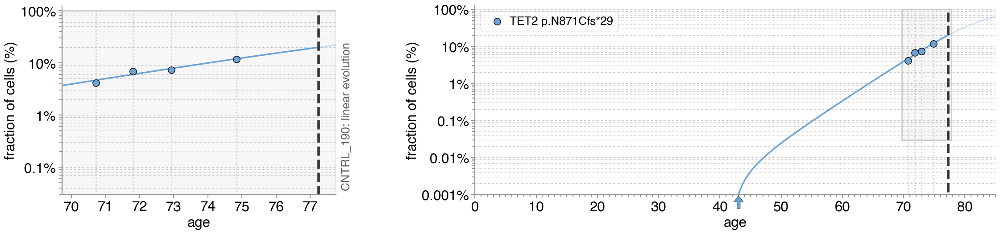

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


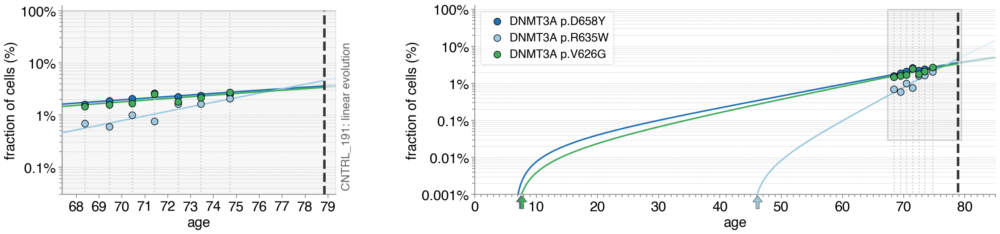

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


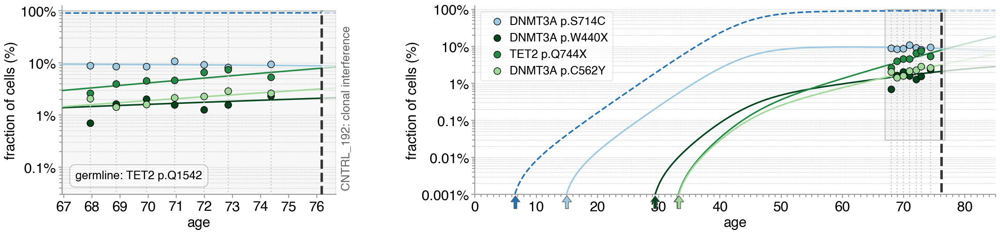

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


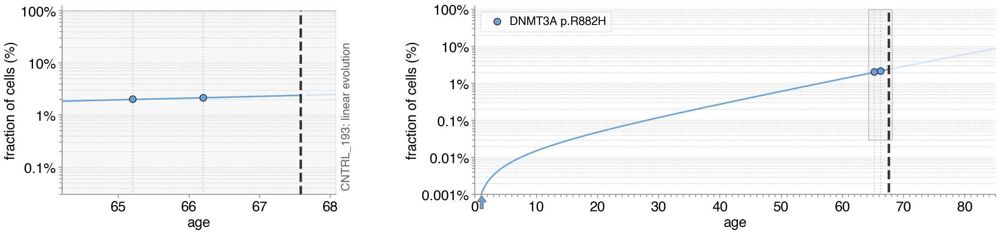

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


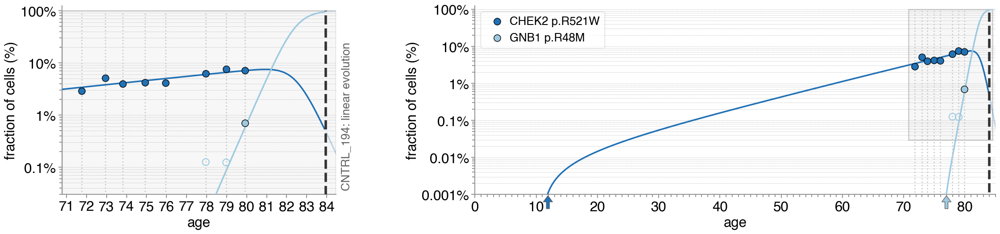

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


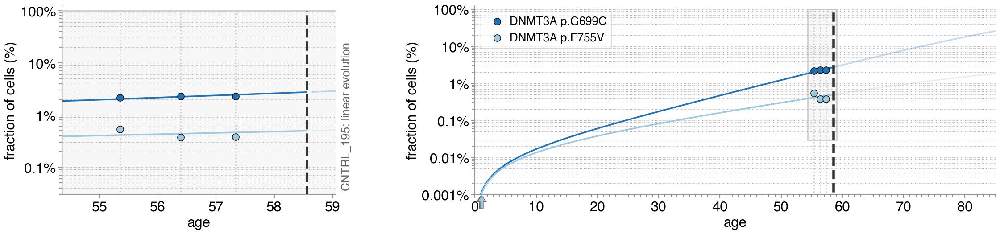

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


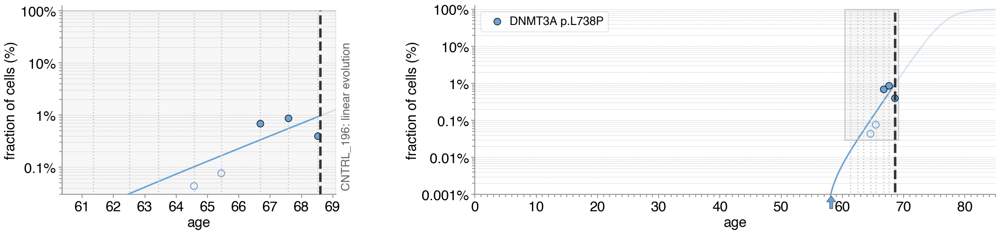

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


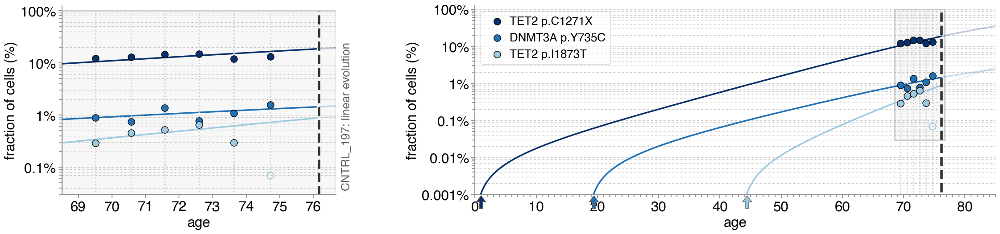

CNTRL_198 data not available


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


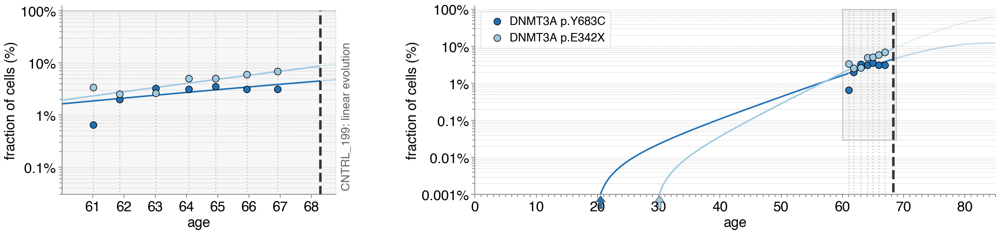

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


CNTRL_200 data not available


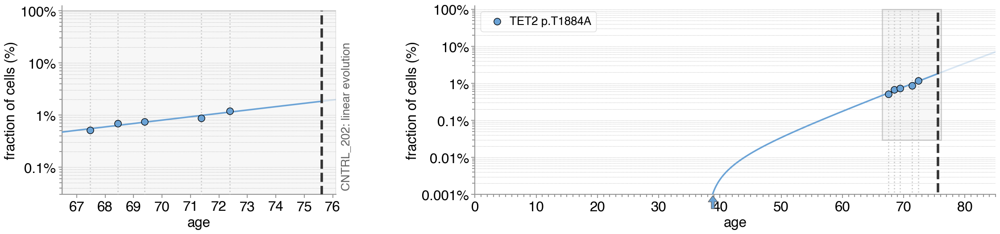

CNTRL_203 data not available


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


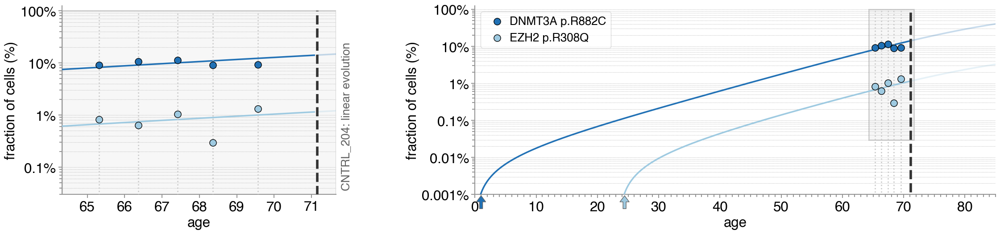

In [242]:
for sample_name in controls:
    sample_ages, ages_dict_names, sample_ages_lists, diagnosis_age = dictionary_sample_details(sample_name)
    sample_variants, variant_details =  sample_trajectories(sample_name, df)
    bounded_sample_variants, all_trajectories_with_bounded = create_bounded_variant_trajectories(sample_name, sample_variants, variant_details)
    try:
        optimised_clones, variant_colors_dict, clone_colors_dict = import_fitness_est_times(sample_name)
        plot_trajectories_cell_fractions(sample_name, optimised_clones, T, dt, sample_variants, bounded_sample_variants, sample_ages_lists, df_germline, diagnosis_age, variant_colors_dict, clone_colors_dict)
    except KeyError:
        print(sample_name+' data not available')